In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))
display(HTML("<style>.output_result { max-width:98% !important; }</style>"))


## Version info:
- all data (ungranted as well)
- IPFs only
- Counting by: inventors

### Imports

In [3]:
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
import plotly.graph_objects as go
import plotly.express as px
import plotly.colors as colors
from datetime import datetime
import re
import os
import csv
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.base import clone
import plotly.io as pio
import math
import itertools as it
from collections import Counter
from random import choice
from nltk.util import ngrams, everygrams
import copy

# Set default color palette
colors_plotly_default = colors.qualitative.Plotly

main_path_mac = '/Users/philippmetzger/Documents/GitHub/battery_patents/'
main_path_ssd = '/Volumes/Samsung Portable SSD T3 Media/'

import sys
packages_path = main_path_mac+'/02 Code'
sys.path.append(packages_path)

from helpers import (current_time_string,
                              image_saver,
                              country_labels_dict,
                              ctry_code_name_dict,
                              message,
                              numbers_dict)


In [3]:
# Create another dictionary that is almost the same as ctry_code_name_dict. Just some values are changed
# due to different country names in UN populations dataset
ctry_code_name_dict_UN = ctry_code_name_dict.copy()

# Define a function for this purpose
def replace_dict_value(dict_, key_, new):
    
    dict_[key_] = new

# Define changes: First values = key, second values = new values
key_new = [
    ('TW', 'China, Taiwan Province of China'),
    ('HK', 'China, Hong Kong SAR'),
    ('SH', 'Saint Helena'),
    ('KP', "Dem. People's Republic of Korea"),
    ('MO', 'China, Macao SAR')
]

# Execute changes
for tuple_ in key_new:
    replace_dict_value(ctry_code_name_dict_UN, tuple_[0], tuple_[1])
    

In [4]:
# Create another dictionary that is almost the same as ctry_code_name_dict. Just some values are changed
# due to different country names in world bank work force dataset
ctry_code_name_dict_world_bank = ctry_code_name_dict.copy()

# Define a function for this purpose
def replace_dict_value(dict_, key_, new):
    
    dict_[key_] = new

# Define changes: First values = key, second values = new values
key_new = [
    ('KR', 'Korea, Rep.'),
    ('US', 'United States'),
    ('HK', 'Hong Kong SAR, China'),
    ('BS', 'Bahamas, The'),
    ('CZ', 'Czech Republic'),
    ('IR', 'Iran, Islamic Rep.'),
    ('SK', 'Slovak Republic'),
    ('VE', 'Venezuela, RB'),
    ('EG', 'Egypt, Arab Rep.'),
    ('KP', "Korea, Dem. People's Rep."),
    ('EG', 'Egypt, Arab Rep.'),
    ('KG', 'Kyrgyz Republic'),
    ('LA', 'Lao PDR'),
    ('MO', 'Macao SAR, China'),
    ('LC', 'St. Lucia'),
    ('TZ', 'Tanzania'),
    ('VN', 'Vietnam')
]

# Execute changes
for tuple_ in key_new:
    replace_dict_value(ctry_code_name_dict_world_bank, tuple_[0], tuple_[1])
    

In [5]:
message()


executing a function from helpers.py


In [6]:
current_time_string()


'2022-01-25_1741'

## Read the whole dataset and reduce it to what we are interested in

In [ ]:
# Read the whole dataset
dataset_name = 'data_batteries_2022-01-12_2001_ipf_only_classes_query_and_technologies_tagged'

path = main_path_ssd+'Dataset saves/04 From 15 Nov 2021 (release of 2021 Autumn edition)/01 Preprocessed/03 ipf only, classes query and technologies tagged/'+dataset_name+'.csv'

print('Loading data from:')
print(path)

data = pd.read_csv(path, delimiter = ";", low_memory = False, na_values=['', ' ', '  '], keep_default_na = False)

print('Number of rows:', len(data))

print('Distinct values in column "granted":', pd.unique(data['granted']))

# Reduce it to what we are interested in
a = (data['non_active_parts_electrodes_secondary_cells'] == 1)
b = (data['charging'] == 1)
c = (data['is_Redox flow'] == 1)
d = (data['is_Nickel–hydrogen'] == 1)

data_reduced = data[a | b | c | d].copy()
del data
data = data_reduced


Loading data from:
/Volumes/Samsung Portable SSD T3 Media/Dataset saves/04 From 15 Nov 2021 (release of 2021 Autumn edition)/01 Preprocessed/03 ipf only, classes query and technologies tagged/data_batteries_2022-01-12_2001_ipf_only_classes_query_and_technologies_tagged.csv


In [8]:
list(data)


['non_active_parts_electrodes_secondary_cells',
 'charging',
 'flow_classes_query',
 'tag',
 'cited_docdb_family_ids',
 'cited_by_docdb_family_ids',
 'docdb_family_id',
 'appln_id',
 'granted',
 'earliest_filing_date',
 'earliest_filing_year',
 'earliest_publn_date',
 'earliest_publn_year',
 'earliest_publn_date_this_family_id',
 'earliest_publn_year_this_family_id',
 'ipc_class_symbols',
 'applt_seq_nr',
 'invt_seq_nr',
 'appln_auth',
 'person_ctry_code',
 'psn_name',
 'han_name',
 'appln_title',
 'appln_title_lg',
 'appln_abstract',
 'appln_abstract_lg',
 'appln_nr',
 'appln_kind',
 'appln_filing_date',
 'appln_filing_year',
 'appln_nr_epodoc',
 'appln_nr_original',
 'ipr_type',
 'receiving_office',
 'internat_appln_id',
 'int_phase',
 'reg_phase',
 'nat_phase',
 'earliest_filing_id',
 'earliest_pat_publn_id',
 'inpadoc_family_id',
 'docdb_family_size',
 'nb_citing_docdb_fam',
 'nb_applicants',
 'nb_inventors',
 'person_id',
 'person_name',
 'person_name_orig_lg',
 'person_address',


## Reduce to years we are interested in

In [9]:
print(set(data['earliest_publn_year_this_family_id']))


{1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019}


In [10]:
data_reduced = data[data['earliest_publn_year_this_family_id'] >= 2000].copy()
del data
data = data_reduced


In [11]:
print(set(data['earliest_publn_year_this_family_id']))


{2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019}


In [12]:
only_granted = False


In [13]:
len(list(set(data['docdb_family_id'])))


92700

In [14]:
len(list(set(data[data['non_active_parts_electrodes_secondary_cells'] == 1]['docdb_family_id'])))


63282

In [15]:
92700 - 63282

29418

In [16]:
len(list(set(data[data['charging'] == 1]['docdb_family_id'])))


44039

In [17]:
len(list(set(data[data['is_Redox flow'] == 1]['docdb_family_id'])))


843

In [18]:
set(data['tag'])


{'IPF'}

### In person_ctry_code: Replace NaNs with '  '

In [19]:
data['person_ctry_code'].fillna('  ', inplace = True)
#data['person_ctry_code_imputed'].fillna('  ', inplace = True)


In [20]:
def check_if_docdb_family_size_is_equal_to_number_of_applications(data_to_check):

    """Version 2 - 3. Jan 2022 (altered version from function in Create_db_4)
    Does not print when unequal. Instad increments a counter that it returns."""
    
    reduced = data_to_check[['docdb_family_id','appln_id','docdb_family_size']].drop_duplicates()

    family_ids = pd.unique(reduced['docdb_family_id'])

    counter = 0
    
    for family_id in tqdm(family_ids):
        
        reduced_this_family_id = reduced[reduced['docdb_family_id'] == family_id]

        len_ = len(reduced_this_family_id)
        docdb_family_size = list(set(reduced_this_family_id['docdb_family_size']))

        if len(docdb_family_size) > 1:
            print(str(family_id)+': There is more than one docdb_family_size.')
            break

        docdb_family_size = docdb_family_size[0]

        if (len_ != docdb_family_size):
            #print(str(family_id)+': docdb_family_size is not equal to the number of applications contained in this family')
            counter += 1
            
    return counter

In [21]:
# Returns 0 if all is as it should be

#check_if_docdb_family_size_is_equal_to_number_of_applications(data)


### Infer our time frame from data

In [22]:
year_begin = min(data['earliest_publn_year_this_family_id'])
year_end = max(data['earliest_publn_year_this_family_id'])

years = list(range(year_begin, year_end + 1))
print(years)


[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]


#### Check the percentage of missing values in person_ctry_code


In [23]:
len(data[data['person_ctry_code'] == '  ']) / len(data)
#len(data[data['person_ctry_code'].isna()]) / len(data)
#len(data[data['person_ctry_code'] == '  ']) / len(data)
#len(data[data['person_ctry_code'].isna()]) / len(data)


0.3070879822843029

#### Check how many battery patent families this data contains

In [24]:
len(pd.unique(data['docdb_family_id']))


92700

#### Check how many battery patent applications this data contains

In [25]:
len(pd.unique(data['appln_id']))


378625

#### Check the application authority distribution for these entries

In [26]:
nan_data_appln_auth_counts = data[data['person_ctry_code'] == '  '].groupby(by='appln_auth').count().sort_values(by='docdb_family_id', ascending=False).rename(columns=({'docdb_family_id':'count'}))['count']
nan_data_appln_auth_counts[:10]


appln_auth
CN    223386
JP    144619
KR     31137
AU     14767
WO     12088
ES      6481
HK      4170
MX      2521
US      2249
BR      1471
Name: count, dtype: int64

In [27]:
# Share of applications without c.o.o. that are filed in China

nan_share_china = nan_data_appln_auth_counts['CN'] / nan_data_appln_auth_counts.sum()
nan_share_china


0.4956533315582773

In [28]:
# Share of applications without c.o.o. that are filed in Japan

nan_share_japan = nan_data_appln_auth_counts['JP'] / nan_data_appln_auth_counts.sum()
nan_share_japan


0.3208835341365462

In [29]:
# Share of applications without c.o.o. that are filed in the rest of the world

1 - nan_share_china - nan_share_japan


0.18346313430517652

In [30]:
# Old version without technologies mode

if False:
    
    def get_counts(data_to_function, use_tqdm, nat_intl_separation, count_inventors):
    
        if count_inventors:
            data_to_function = data_to_function[data_to_function['invt_seq_nr'] > 0]
        else:
            data_to_function = data_to_function[data_to_function['applt_seq_nr'] > 0]

        ctry_codes_this = sorted(list(set(data_to_function['person_ctry_code'])))

        family_ids_this = pd.unique(data_to_function['docdb_family_id'])

        family_id_ctry_codes = {}
        family_id_coo_appln_auth = {}

        # A wrapper function for turning tqdm on or off
        def tqdm_wrapper(input_):
            if use_tqdm:
                return tqdm(input_)
            else:
                return input_

        # Loop over family IDs and get all country codes of each family ID. Also delete unknown country code entries
        # (country code = '  ')
        for family_id in tqdm_wrapper(family_ids_this):

            data_this_family_id = data_to_function[data_to_function['docdb_family_id']==family_id]

            ctry_codes_this_family_id = list(set(data_this_family_id['person_ctry_code']))

            try:
                ctry_codes_this_family_id.remove('  ')
            except:
                pass

            family_id_ctry_codes[family_id] = ctry_codes_this_family_id

        # Create a dictionary full of zeros
        ctry_codes_counts = {}
        for key_ in ctry_codes_this:

            ctry_codes_counts[key_] = 0

            if nat_intl_separation:

                key_intl_string = key_+'_intl'
                ctry_codes_counts[key_intl_string] = 0

        # Loop over dictionary and increment its values to create the count
        # Increment by 1/k, k being the number of distinct country codes for a given family ID
        nat_int_counter = {'national':0,
                           'international':0,
                           'unknown':0}
        for key_ in list(family_id_ctry_codes):

            size_ = len(family_id_ctry_codes[key_])

            if size_==0:

                ctry_codes_counts['  '] += 1

                nat_int_counter['unknown'] += 1

            else:

                if nat_intl_separation:

                    if size_==1:

                        ctry_codes_counts[family_id_ctry_codes[key_][0]] += 1

                        nat_int_counter['national'] += 1

                    else:

                        for item in family_id_ctry_codes[key_]:

                            item_intl_string = item+'_intl'

                            ctry_codes_counts[item_intl_string] += (1/size_)

                        nat_int_counter['international'] += 1

                else:

                    for item in family_id_ctry_codes[key_]:

                        ctry_codes_counts[item] += (1/size_)

        ctry_codes_counts_sorted = dict(sorted(ctry_codes_counts.items(), key=lambda x:x[1], reverse=True))

        try:
            known_percentage = (1 - (ctry_codes_counts['  '] / sum(ctry_codes_counts.values()))) * 100
        except:
            known_percentage = 100

        if nat_intl_separation:
            return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage, ctry_codes_this, nat_int_counter

        else:
            return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage


In [31]:
# New version (4. Jan. 2022) with technologies mode

if False:
    
    def get_counts(data_to_function, use_tqdm, nat_intl_separation, count_inventors, technologies):
    
        if count_inventors:
            data_to_function = data_to_function[data_to_function['invt_seq_nr'] > 0]
        else:
            data_to_function = data_to_function[data_to_function['applt_seq_nr'] > 0]

        ctry_codes_this = sorted(list(set(data_to_function['person_ctry_code'])))

        family_ids_this = pd.unique(data_to_function['docdb_family_id'])

        family_id_ctry_codes = {}
        family_id_coo_appln_auth = {}

        if technologies:
            # Dictionary for the number of technologies each patent family is assignted to
            family_id_num_technologies = {}

        # A wrapper function for turning tqdm on or off
        def tqdm_wrapper(input_):
            if use_tqdm:
                return tqdm(input_)
            else:
                return input_

        # Loop over family IDs and get all country codes of each family ID. Also delete unknown country code entries
        # (country code = '  ')
        for family_id in tqdm_wrapper(family_ids_this):

            data_this_family_id = data_to_function[data_to_function['docdb_family_id']==family_id]

            ctry_codes_this_family_id = list(set(data_this_family_id['person_ctry_code']))

            try:
                ctry_codes_this_family_id.remove('  ')
            except:
                pass

            family_id_ctry_codes[family_id] = ctry_codes_this_family_id

            if technologies:
                # Save the number of technologies this patent family is assignted to
                num_technologies_this_family_id = list(set(data_this_family_id['technologies_one_hot_sum']))

                # Throw error if there is more than one distinct value
                if len(num_technologies_this_family_id) > 1:
                    print('More than one one-hot-sum')
                    return

                family_id_num_technologies[family_id] = num_technologies_this_family_id[0]

        # Create a dictionary full of zeros
        ctry_codes_counts = {}
        for key_ in ctry_codes_this:

            ctry_codes_counts[key_] = 0

            if nat_intl_separation:

                key_intl_string = key_+'_intl'
                ctry_codes_counts[key_intl_string] = 0

        # Loop over dictionary and increment its values to create the count
        # Increment by 1/k, k being the number of distinct country codes for a given family ID
        nat_int_counter = {'national':0,
                           'international':0,
                           'unknown':0}
        for key_ in list(family_id_ctry_codes):

            size_ = len(family_id_ctry_codes[key_])

            # Get this patent family's number of technologies it is assignted to
            if technologies:
                l = family_id_num_technologies[key_]
            else:
                l = 1

            if size_==0:

                ctry_codes_counts['  '] += 1/l

                nat_int_counter['unknown'] += 1/l

            else:

                if nat_intl_separation:

                    if size_==1:

                        ctry_codes_counts[family_id_ctry_codes[key_][0]] += 1/l

                        nat_int_counter['national'] += 1/l

                    else:

                        for item in family_id_ctry_codes[key_]:

                            item_intl_string = item+'_intl'

                            ctry_codes_counts[item_intl_string] += (1/size_)/l

                        nat_int_counter['international'] += 1/l

                else:

                    for item in family_id_ctry_codes[key_]:

                        ctry_codes_counts[item] += (1/size_)/l

        ctry_codes_counts_sorted = dict(sorted(ctry_codes_counts.items(), key=lambda x:x[1], reverse=True))

        try:
            known_percentage = (1 - (ctry_codes_counts['  '] / sum(ctry_codes_counts.values()))) * 100
        except:
            known_percentage = 100

        if nat_intl_separation:
            return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage, ctry_codes_this, nat_int_counter

        else:
            return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage


In [32]:
# New version (13. Jan. 2022) with enhanced fractional counting

def get_counts(data_to_function, use_tqdm, nat_intl_separation, count_inventors, technologies):
    
    if count_inventors:
        data_to_function = data_to_function[data_to_function['invt_seq_nr'] > 0]
    else:
        data_to_function = data_to_function[data_to_function['applt_seq_nr'] > 0]
        
    ctry_codes_this = sorted(list(set(data_to_function['person_ctry_code'])))
    
    family_ids_this = pd.unique(data_to_function['docdb_family_id'])

    family_id_ctry_codes = {}
    family_id_coo_appln_auth = {}
    
    if technologies:
        # Dictionary for the number of technologies each patent family is assignted to
        family_id_num_technologies = {}
    
    # A wrapper function for turning tqdm on or off
    def tqdm_wrapper(input_):
        if use_tqdm:
            return tqdm(input_)
        else:
            return input_

    # Loop over family IDs and get all country codes of each family ID. Also delete unknown country code entries
    # (country code = '  ')
    for family_id in tqdm_wrapper(family_ids_this):
        
        data_this_family_id = data_to_function[data_to_function['docdb_family_id']==family_id]

        ##########################################
        # Change in this version (13. Jan. 2022) #
        ##########################################
        # Old code line:
        #ctry_codes_this_family_id = list(set(data_this_family_id['person_ctry_code']))
        # New in this version:
        # Get the person_ctry_codes for each distinct (psn_name, person_ctry_code) pair
        ctry_codes_this_family_id = list(
            data_this_family_id[data_this_family_id['person_ctry_code'] != '  '][['psn_name', 'person_ctry_code']].groupby(
                by = ['psn_name', 'person_ctry_code']
            ).size().reset_index(name='Freq')['person_ctry_code']
        )        
        
        # Not needed anymore
        #try:
        #    ctry_codes_this_family_id.remove('  ')
        #except:
        #    pass
            
        family_id_ctry_codes[family_id] = ctry_codes_this_family_id
        
        if technologies:
            # Save the number of technologies this patent family is assignted to
            num_technologies_this_family_id = list(set(data_this_family_id['technologies_one_hot_sum']))
            
            # Throw error if there is more than one distinct value
            if len(num_technologies_this_family_id) > 1:
                print('More than one one-hot-sum')
                return
            
            family_id_num_technologies[family_id] = num_technologies_this_family_id[0]
        
    # Create a dictionary full of zeros
    ctry_codes_counts = {}
    for key_ in ctry_codes_this:
        
        ctry_codes_counts[key_] = 0
        
        if nat_intl_separation:
            
            key_intl_string = key_+'_intl'
            ctry_codes_counts[key_intl_string] = 0
        
    # Loop over dictionary and increment its values to create the count
    # Increment by 1/k, k being the number of distinct country codes for a given family ID
    nat_int_counter = {'national':0,
                       'international':0,
                       'unknown':0}
    for key_ in list(family_id_ctry_codes):

        size_ = len(family_id_ctry_codes[key_])
        
        # New in this version (13. Jan. 2022). Need this for nat_intl_separation separation mode
        num_distinct_ctry_codes_this_id = len(list(set(family_id_ctry_codes[key_])))
        
        # Get this patent family's number of technologies it is assignted to
        if technologies:
            l = family_id_num_technologies[key_]
        else:
            l = 1

        if size_==0:

            ctry_codes_counts['  '] += 1/l
            
            nat_int_counter['unknown'] += 1/l

        else:
            
            if nat_intl_separation:
                
                # Changed in this version (13. Jan. 2022):
                if num_distinct_ctry_codes_this_id == 1:
                    
                    ctry_codes_counts[family_id_ctry_codes[key_][0]] += 1/l
                    
                    nat_int_counter['national'] += 1/l
                    
                else:
                    
                    for item in family_id_ctry_codes[key_]:
                        
                        item_intl_string = item+'_intl'

                        ctry_codes_counts[item_intl_string] += (1/size_)/l
                        
                    nat_int_counter['international'] += 1/l
            
            else:

                for item in family_id_ctry_codes[key_]:

                    ctry_codes_counts[item] += (1/size_)/l
    
    ctry_codes_counts_sorted = dict(sorted(ctry_codes_counts.items(), key=lambda x:x[1], reverse=True))

    try:
        known_percentage = (1 - (ctry_codes_counts['  '] / sum(ctry_codes_counts.values()))) * 100
    except:
        known_percentage = 100

    if nat_intl_separation:
        return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage, ctry_codes_this, nat_int_counter
    
    else:
        return family_id_ctry_codes, ctry_codes_counts_sorted, known_percentage
    

## Separation of patent families with applicants from only one country vs. international cooperations

In [33]:
def nat_int_prepare_df(nat_intl_dict, ctry_codes_list):
    
    dict_ = nat_intl_dict.copy()
    list_ = ctry_codes_list.copy()
    
    dict_.pop('  ')
    dict_.pop('  _intl')
    list_.remove('  ')
    
    #####
    
    array_ = []

    for key_ in list_:

        key_intl_string = key_+'_intl'

        if key_ in list(country_labels_dict):
            country_name = country_labels_dict[key_]
        else:
            country_name = ctry_code_name_dict[key_]

        row = [country_name, dict_[key_], dict_[key_intl_string]]

        array_.append(row)
        
    #####
    
    num_countries_to_plot = 6

    col_1 = 'Country'
    col_2 = 'Patent families with national inventors only'
    col_3 = 'Patent families with inventors from at least one other country'

    nat_intl_df = pd.DataFrame(array_, index=None, columns = [col_1, col_2, col_3]).sort_values([col_2, col_3], ascending=True)
    nat_intl_df = nat_intl_df[-num_countries_to_plot:]

    #####
    
    col_4 = 'intl/(nat+intl)'
    col_5 = 'nat+intl'

    nat_intl_ratio_df = nat_intl_df.copy()
    nat_intl_ratio_df[col_4] = nat_intl_ratio_df['Patent families with inventors from at least one other country'] / (nat_intl_ratio_df['Patent families with national inventors only'] + nat_intl_ratio_df['Patent families with inventors from at least one other country'])
    nat_intl_ratio_df[col_5] = (nat_intl_ratio_df['Patent families with national inventors only'] + nat_intl_ratio_df['Patent families with inventors from at least one other country'])
    nat_intl_ratio_df.sort_values([col_5], ascending=True, inplace = True)
    
    return nat_intl_ratio_df


In [34]:
def nat_int_plot(df, years):
    
    col_1 = 'Country'
    col_2 = 'Patent families with national inventors only'
    col_3 = 'Patent families with inventors from at least one other country'
    col_4 = 'intl/(nat+intl)'
    col_5 = 'nat+intl'
    
    x_label_string = 'Total number of battery patent families in '+str(min(years))+'-'+str(max(years))
    #y_label_string = 'Country code'

    nat_intl_counts_plot = px.bar(df,
                                  y = "Country",
                                  x=[col_2, col_3])
    nat_intl_counts_plot.update_xaxes(title=x_label_string)

    nat_intl_counts_plot.update_layout(
        legend=dict(yanchor="bottom",
                    y=0.02,
                    xanchor="right",
                    x=0.99,
                    title=''))

    for i in range(len(df)):
        nat_intl_counts_plot.add_annotation(x = list(df[col_5])[i],
                                            y = i,
                                            text = str(round(list(df[col_4])[i]*100, 2))+'%',
                                            showarrow = False,
                                            xshift = 25)

    nat_intl_counts_plot.show()

    # Save this plot as eps
    if only_granted:
        filename = 'nat_intl_counts_only_granted'
    else:
        filename = 'nat_intl_counts_all_appln'

    image_saver(nat_intl_counts_plot, filename, True)
    

### Whole time period

In [35]:
family_id_ctry_codes_whole_time_nat_intl, ctry_codes_counts_whole_time_nat_intl, known_percentage_whole_time_nat_intl, ctry_codes_whole_time, nat_int_counter_whole_time = get_counts(
    data,
    True,
    True,
    True,
    False)


  0%|          | 0/92667 [00:00<?, ?it/s]

### Split in two time periods

In [36]:
years_nat_int_first_part = [2000, 2013]

data_nat_int_first_part = data[
    ((data['earliest_publn_year_this_family_id'] >= years_nat_int_first_part[0]) & (data['earliest_publn_year_this_family_id'] <= years_nat_int_first_part[1]))]

family_id_ctry_codes_first_part_nat_intl, ctry_codes_counts_first_part_nat_intl, known_percentage_first_part_nat_intl, ctry_codes_first_part, nat_int_counter_first_part = get_counts(
    data_nat_int_first_part,
    True,
    True,
    True,
    False)

years_nat_int_second_part = [2014, 2018]

data_nat_int_second_part = data[
    ((data['earliest_publn_year_this_family_id'] >= years_nat_int_second_part[0]) & (data['earliest_publn_year_this_family_id'] <= years_nat_int_second_part[1]))
]

family_id_ctry_codes_second_part_nat_intl, ctry_codes_counts_second_part_nat_intl, known_percentage_second_part_nat_intl, ctry_codes_second_part, nat_int_counter_second_part = get_counts(
    data_nat_int_second_part,
    True,
    True,
    True,
    False)


  0%|          | 0/39580 [00:00<?, ?it/s]

  0%|          | 0/41949 [00:00<?, ?it/s]

In [37]:
set(data_nat_int_first_part['earliest_publn_year_this_family_id'])


{2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013}

In [38]:
set(data_nat_int_second_part['earliest_publn_year_this_family_id'])


{2014, 2015, 2016, 2017, 2018}

### Get the dataframes

In [39]:
nat_intl_df_whole_whole_time = nat_int_prepare_df(ctry_codes_counts_whole_time_nat_intl,
                                                  ctry_codes_whole_time)
nat_intl_df_whole_whole_time


,Country,Patent families with national inventors only,Patent families with inventors from at least one other country,intl/(nat+intl),nat+intl
118,Taiwan,2921.0,371.131874,0.112733,3292.131874
22,China,7931.0,783.981651,0.089958,8714.981651
28,Germany,8024.0,723.340387,0.082693,8747.340387
121,USA,11529.0,1854.210054,0.138547,13383.210054
64,South Korea,13340.0,612.002101,0.043865,13952.002101
58,Japan,31520.0,525.056969,0.016385,32045.056969


In [40]:
nat_intl_df_whole_first_part = nat_int_prepare_df(ctry_codes_counts_first_part_nat_intl,
                                                  ctry_codes_first_part)
nat_intl_df_whole_first_part


,Country,Patent families with national inventors only,Patent families with inventors from at least one other country,intl/(nat+intl),nat+intl
104,Taiwan,1469.0,214.967978,0.127656,1683.967978
22,China,1767.0,387.519668,0.179864,2154.519668
28,Germany,3490.0,351.865485,0.091587,3841.865485
61,South Korea,4642.0,305.654002,0.061778,4947.654002
107,USA,5001.0,951.014358,0.159780,5952.014358
55,Japan,14969.0,303.324547,0.019861,15272.324547


In [41]:
nat_intl_df_whole_second_part = nat_int_prepare_df(ctry_codes_counts_second_part_nat_intl,
                                                   ctry_codes_second_part)
nat_intl_df_whole_second_part


,Country,Patent families with national inventors only,Patent families with inventors from at least one other country,intl/(nat+intl),nat+intl
93,Taiwan,1216.0,120.670747,0.090277,1336.670747
21,Germany,3485.0,294.781270,0.077989,3779.781270
16,China,4461.0,316.359920,0.066221,4777.359920
96,USA,5319.0,748.376396,0.123344,6067.376396
50,South Korea,6896.0,265.060837,0.037014,7161.060837
47,Japan,13241.0,184.915975,0.013773,13425.915975


### Plot national/international counts

In [42]:
nat_int_plot(nat_intl_df_whole_whole_time, years)


executing a function from helpers.py


In [43]:
nat_int_plot(nat_intl_df_whole_first_part, years_nat_int_first_part)


executing a function from helpers.py


In [44]:
nat_int_plot(nat_intl_df_whole_second_part, years_nat_int_second_part)


executing a function from helpers.py


## Grouped bar plot comparing percentages from first and second time periods

In [45]:
colname_first_part = 'Share of co-inventions in '+str(min(years_nat_int_first_part))+'-'+str(max(years_nat_int_first_part))
colname_second_part = 'Share of co-inventions in '+str(min(years_nat_int_second_part))+'-'+str(max(years_nat_int_second_part))

comparison_df = pd.DataFrame.from_records(
    [
        dict(nat_intl_df_whole_first_part[['Country', 'intl/(nat+intl)']].values),
        dict(nat_intl_df_whole_second_part[['Country', 'intl/(nat+intl)']].values)
    ],
    index = [
        colname_first_part,
        colname_second_part
    ]
)

# Transpose and reverse row order
comparison_df = comparison_df.transpose()[::-1]
comparison_df


,Share of co-inventions in 2000-2013,Share of co-inventions in 2014-2018
Japan,0.019861,0.013773
USA,0.159780,0.123344
South Korea,0.061778,0.037014
Germany,0.091587,0.077989
China,0.179864,0.066221
Taiwan,0.127656,0.090277


In [46]:
countries = list(comparison_df.index)

cols = list(comparison_df)
#cols.reverse()

co_invention_ratio_data = []
for col_ in cols:
    co_invention_ratio_data.append(
        go.Bar(name = col_,
               y = countries,
               x = list(comparison_df[col_]),
               orientation='h')
    )

co_invention_ratio_layout = go.Layout(
    
    legend = dict(
        orientation="h",
        yanchor="top",
        y = -0.07,
        xanchor="left",
        x = 0,
        #traceorder = 'reversed'
    ),
    
    plot_bgcolor = "white",
    
    yaxis=dict(
        #title = 'Country',
        color = 'black',
        showgrid = False,
        #gridwidth = 1,
        #gridcolor = 'black',
        #type = "log",
        dtick = 0.5
    ),
    
    xaxis=dict(
        #title = '%',
        color = 'black',
        showgrid = True,
        gridwidth = 1,
        gridcolor = 'black',
        tickformat = '%'
        #dtick = 1
    )
)
    
co_invention_ratio_plot = go.Figure(data = co_invention_ratio_data, layout = co_invention_ratio_layout)

co_invention_ratio_plot.update_yaxes(autorange="reversed")
#co_invention_ratio_plot.update_legend(traceorder="reversed")

# Add annotations
shift_dir = -1
for col_ in list(comparison_df):
    
    shift_dir = shift_dir * (-1)
    
    for i in range(len(comparison_df)):
        
        co_invention_ratio_plot.add_annotation(x = list(comparison_df[col_])[i],
                                               y = i,
                                               text = str(round(list(comparison_df[col_])[i]*100, 1))+'%',
                                               showarrow = False,
                                               xshift = 25,
                                               yshift = shift_dir * 10,
                                               bgcolor = 'white',
                                               #opacity=0.1
                                              )
    
# Change the bar mode
co_invention_ratio_plot.update_layout(barmode='group')
co_invention_ratio_plot.show()

image_saver(co_invention_ratio_plot, 'co_invention_ratio_plot', True)


executing a function from helpers.py


## Run for the whole time period

In [47]:
family_id_ctry_codes_whole_time, ctry_codes_counts_whole_time, known_percentage_whole_time = get_counts(data,
                                                                                                        True,
                                                                                                        False,
                                                                                                        True,
                                                                                                        False)

#, ctry_codes, nat_int_counter


  0%|          | 0/92667 [00:00<?, ?it/s]

In [48]:
known_percentage_whole_time


98.01115823324395

In [49]:
#ctry_codes_counts_whole_time


### "Whole timespan" plot

In [4]:
path = main_path_mac + '03 Extra data/PATSTAT reference tables/TLS801_COUNTRY.csv'
continents_patstat = pd.read_csv(path, delimiter = ';').dropna().reset_index(drop=True)
continents_patstat = continents_patstat[['ctry_code', 'continent']]
continents_patstat


,ctry_code,continent
0,AD,Europe
1,AE,Asia
2,AF,Asia
3,AG,North America
4,AI,North America
...,...,...
220,YE,Asia
221,YU,Europe
222,ZA,Africa
223,ZM,Africa


In [58]:
ctry_code_continent_dict = {}

for i in range(len(continents_patstat)):
    
    ctry_code_continent_dict[continents_patstat.loc[i,'ctry_code']] = continents_patstat.loc[i,'continent']
    

In [59]:
# Delete the counter for missing ctry_code values and create a sorted the dictionary with the other counters
data_whole_timespan_plot = ctry_codes_counts_whole_time.copy()
data_whole_timespan_plot.pop('  ')
data_whole_timespan_plot = dict(sorted(data_whole_timespan_plot.items(), key=lambda x:x[1], reverse=False))


In [60]:
# Save this data in order to use it in Co_occurences for size of country dots in network visualisation

if False:
    
    # open file for writing, "w" is writing
    if only_granted:
        file_ = open("country_sizes_only_granted.csv", "w")
    else:
        file_ = open("country_sizes_all_appln.csv", "w")

    # Create a csv writer
    writer_ = csv.writer(file_)

    # loop over dictionary keys and values
    for key_, value_ in data_whole_timespan_plot.items():

        # write every key and value to file
        writer_.writerow([key_, value_])

    # Close the file
    file_.close()


In [61]:
number_countries = 8

countries_written = [country_labels_dict[item] for item in list(data_whole_timespan_plot.keys())[-number_countries:]]
continents = [ctry_code_continent_dict[item] for item in list(data_whole_timespan_plot.keys())[-number_countries:]]

df_countries = pd.DataFrame(data=[list(data_whole_timespan_plot.values())[-number_countries:],
                                  continents],
                            columns=countries_written, index=['Count', 'Continent']).transpose().reset_index(drop=False)

df_countries = df_countries.rename(columns={'index':'Country'})

df_countries = df_countries.sort_values(by='Count', ascending=False)

df_countries


,Country,Count,Continent
7,Japan,32045.056969,Asia
6,South Korea,13952.002101,Asia
5,USA,13383.210054,North America
4,Germany,8747.340387,Europe
3,China,8714.981651,Asia
2,Taiwan,3292.131874,Asia
1,France,2528.540721,Europe
0,UK,1227.382398,Europe


In [62]:
top_countries_title = 'Top ' + str(number_countries) + ' countries of origin of battery patents, ' +str(min(years))+'-'+str(max(years))

x_label_string = 'Total number of battery patent families in '+str(year_begin)+'-'+str(year_end)
y_label_string = 'Country'

top_countries_plot = px.bar(df_countries,
                            x = 'Count', 
                            y = 'Country', 
                            color = 'Continent', 
                            orientation='h',
                            labels = {'Count':x_label_string, 'Country':y_label_string}
                           )

top_countries_plot.update_layout(yaxis={'categoryorder':'total ascending'},
                                 #title=top_countries_title
                                )

top_countries_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'totals_by_country_only_granted'
else:
    filename = 'totals_by_country_all_appln'
    
image_saver(top_countries_plot, filename, True)

top_countries_title


executing a function from helpers.py


'Top 8 countries of origin of battery patents, 2000-2019'

In [63]:
# Old version without colors for the continents

if False:
    
    number_countries = 8

    countries_written = [country_labels_dict[item] for item in list(data_whole_timespan_plot.keys())[-number_countries:]]

    fig = go.Figure(go.Bar(
                x=list(data_whole_timespan_plot.values())[-number_countries:],
                y=countries_written,
                orientation='h'))

    title = 'Top '+str(number_countries)+' countries by origins of the applicants, '+str(year_begin)+'-'+str(year_end)

    fig.update_layout(
        title=dict(text=title),
                     yaxis=dict(title='Country code'),
                     xaxis=dict(title='Total number of battery patent families in '+str(year_begin)+'-'+str(year_end)),
                              legend = dict(
                                xanchor="center",
                                yanchor="top",
                                y=-0.18, 
                                x=0.5   
                              )
    )

    fig.show()


#### For each year

In [64]:
family_id_ctry_codes_list = []
ctry_codes_counts_list = []
known_percentage_list = []

for year in years:
    
    print('Year', str(year))
    
    data_to_function = data[data['earliest_publn_year_this_family_id']==year]
    
    family_id_ctry_codes, ctry_codes_counts, known_percentage = get_counts(data_to_function,
                                                                           True,
                                                                           False,
                                                                           True,
                                                                           False)
    
    family_id_ctry_codes_list = family_id_ctry_codes_list + [family_id_ctry_codes]
    ctry_codes_counts_list = ctry_codes_counts_list + [ctry_codes_counts]
    known_percentage_list = known_percentage_list + [known_percentage]
        

Year 2000


  0%|          | 0/979 [00:00<?, ?it/s]

Year 2001


  0%|          | 0/1164 [00:00<?, ?it/s]

Year 2002


  0%|          | 0/1132 [00:00<?, ?it/s]

Year 2003


  0%|          | 0/1195 [00:00<?, ?it/s]

Year 2004


  0%|          | 0/1288 [00:00<?, ?it/s]

Year 2005


  0%|          | 0/1594 [00:00<?, ?it/s]

Year 2006


  0%|          | 0/1998 [00:00<?, ?it/s]

Year 2007


  0%|          | 0/2152 [00:00<?, ?it/s]

Year 2008


  0%|          | 0/2484 [00:00<?, ?it/s]

Year 2009


  0%|          | 0/2816 [00:00<?, ?it/s]

Year 2010


  0%|          | 0/3380 [00:00<?, ?it/s]

Year 2011


  0%|          | 0/5163 [00:00<?, ?it/s]

Year 2012


  0%|          | 0/6770 [00:00<?, ?it/s]

Year 2013


  0%|          | 0/7465 [00:00<?, ?it/s]

Year 2014


  0%|          | 0/7976 [00:00<?, ?it/s]

Year 2015


  0%|          | 0/7796 [00:00<?, ?it/s]

Year 2016


  0%|          | 0/7904 [00:00<?, ?it/s]

Year 2017


  0%|          | 0/8514 [00:00<?, ?it/s]

Year 2018


  0%|          | 0/9759 [00:00<?, ?it/s]

Year 2019


  0%|          | 0/11138 [00:00<?, ?it/s]

In [66]:
print(known_percentage_list)


[98.67211440245148, 98.79725085910653, 99.29328621908127, 99.4142259414226, 98.68012422360249, 99.12170639899624, 98.6986986986987, 98.7453531598513, 97.54428341384865, 97.26562500000001, 98.90532544378698, 97.55955839628123, 97.34121122599704, 97.1868720696584, 97.17903711133398, 98.10159055926115, 98.17813765182186, 98.50833920601362, 98.40147556102058, 97.97091039683964]


In [67]:
df = pd.DataFrame.from_records(ctry_codes_counts_list)
df.insert(loc=0, column='year', value=years)
df.rename(columns={'  ':'unknown'}, inplace=True)
df.fillna(0, inplace=True)
df_with_unknowns = df
#df


In [1]:
# Save this result to csv
#years_string = str(year_begin)+'-'+str(year_end)
#filename = 'country_counts_yearly_'+years_string+'.csv'
#df.to_csv(path_or_buf=filename, sep=';', index=False)


### "Yearly totals" plot

In [69]:
totals_series = df.drop(columns='year').sum(axis=1)
totals_series


0       979.0
1      1164.0
2      1132.0
3      1195.0
4      1288.0
5      1594.0
6      1998.0
7      2152.0
8      2484.0
9      2816.0
10     3380.0
11     5163.0
12     6770.0
13     7465.0
14     7976.0
15     7796.0
16     7904.0
17     8514.0
18     9759.0
19    11138.0
dtype: float64

In [70]:
if False:
    
    totals_df = pd.DataFrame()

    totals_df['year'] = years
    totals_df['count'] = totals_series

    totals_df.to_csv(path_or_buf= 'total_yearly_counts', sep=';', index=False)

    totals_df


,year,count
0,2000,979.0
1,2001,1164.0
2,2002,1132.0
3,2003,1195.0
4,2004,1288.0
5,2005,1594.0
6,2006,1998.0
7,2007,2152.0
8,2008,2484.0
9,2009,2816.0


In [71]:
cut = 2014

totals_df_first_part = totals_df[totals_df['year'] <= cut]
#totals_df_first_part

totals_df_second_part = totals_df[totals_df['year'] > cut]
#totals_df_second_part

years_first_part = list(totals_df_first_part['year'])
sum_first_part = totals_df_first_part['count'].sum()
print(years_first_part)
print(sum_first_part)
print()

years_second_part = list(totals_df_second_part['year'])
sum_second_part = totals_df_second_part['count'].sum()
print(years_second_part)
print(sum_second_part)


[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
47555.99999999996

[2015, 2016, 2017, 2018, 2019]
45110.9999999998


In [72]:
totals_data = [dict(type='bar',
                        x=years,
                        y=totals_series
                       )]


In [73]:
# Compute mean increase year-over-year

increase = []

for i in range(1,len(totals_series)):
    
    increase_this_year = (totals_series[i] - totals_series[i-1]) / totals_series[i-1]
    print(increase_this_year)
    increase.append(increase_this_year)
    
sum(increase) / len(increase)


0.18896833503575422
-0.027491408934709843
0.055653710247348095
0.07782426778242797
0.2375776397515529
0.253450439146805
0.07707707707707387
0.15427509293680783
0.13365539452496264
0.20028409090908303
0.5275147928994088
0.31125314739492743
0.10265878877399964
0.06845277963831045
-0.02256770310932978
0.013853258081073475
0.07717611336032165
0.14622973925298674
0.14130546162517055


0.14300794823126184

In [74]:
totals_title = 'Global development of the number of battery patent families, '+str(min(years))+'-'+str(max(years))

totals_layout =dict(#title=dict(text = totals_title),
                    yaxis=dict(title='Number of battery patent families'),
                    xaxis=dict(title='Year'),
                          legend = dict(
                            xanchor="center",
                            yanchor="top",
                            y=-0.18, 
                            x=0.5   
                          )
                )


In [75]:
totals_plot = go.Figure(data = totals_data, layout=totals_layout)
           
totals_plot.update_xaxes(dtick=1)

totals_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'development_global_only_granted'
else:
    filename = 'development_global_all_appln'
    
image_saver(totals_plot, filename, True)

totals_title


executing a function from helpers.py


'Global development of the number of battery patent families, 2000-2019'

# "Yearly, by country" plot

In [76]:
df.drop(columns='unknown', inplace=True)
df


,year,JP,US,DE,KR,FR,TW,IT,CA,GB,...,KW,MC,ET,MK,NC,SC,ZM,GH,SN,LA
0,2000,420.404798,206.904959,98.139195,58.805916,32.085498,23.692157,18.696078,16.464286,15.882576,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
1,2001,528.590476,240.416910,104.909026,81.551190,35.891897,17.333333,8.066667,17.690240,19.190018,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
2,2002,508.617279,197.003017,117.171898,82.562500,32.877778,28.626984,14.242424,16.559737,21.912973,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
3,2003,494.554654,218.270757,119.844760,71.994048,34.281297,66.084524,6.681818,26.555271,18.948164,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
4,2004,538.014286,217.974249,130.057828,100.684188,40.400433,39.903788,21.542857,25.644210,32.482740,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
5,2005,658.617381,274.930312,129.325155,173.503510,33.044444,77.422222,20.766387,35.861111,20.993764,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
6,2006,728.050742,309.731938,161.253308,330.435606,68.897619,86.850000,10.587500,32.671761,23.241667,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
7,2007,814.378613,385.326481,158.338931,277.213480,62.937302,95.209127,13.636344,35.984800,39.068831,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
8,2008,943.415085,441.729396,176.371524,262.320996,91.622533,136.688528,22.104701,28.708340,38.373846,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0
9,2009,1007.258560,485.284475,263.386605,285.966688,89.096949,149.036723,33.003074,41.498084,37.821687,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.000,0.000000,0.0


In [77]:
# Get the labels of the countries with the highest totals
number_of_countries = 8
highest_total_labels = list(df.drop(columns='year').sum().sort_values(ascending=False).index[0:number_of_countries])
highest_total_labels


['JP', 'KR', 'US', 'DE', 'CN', 'TW', 'FR', 'GB']

In [78]:
for i, country in enumerate(highest_total_labels):
    
    x = df['year']
    y = df[country]
    country_name = country_labels_dict[country]
    #print(country)
    
    line_width = 3
    
    if True:
        if i == 0:
            person_ctry_code_data = [dict(type = 'scatter',
                                          x = x,
                                          y = y,
                                          name = country_name,
                                          line_width = line_width
                                         )
                                    ]
        else:
            if True:
                person_ctry_code_data.append(dict(type = 'scatter',
                                                  x = x,
                                                  y = y,
                                                  name = country_name,
                                                  line_width = line_width
                                                 )
                                            )
                

In [79]:
person_ctry_code_title = "Development of the absolute number of battery IPFs:<br>Counted by inventors' countries of origin, "+str(min(years))+'-'+str(max(years))

person_ctry_code_layout =dict(
    title=dict(
        text = person_ctry_code_title,
        y = 0.9,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'black')
    ),
    yaxis = dict(
        color = 'black',
        title = 'Number of IPFs',
        showgrid = True,
        gridwidth = 1,
        gridcolor = 'black',
        zerolinecolor = 'black',
        zerolinewidth = 1
    ),
    xaxis = dict(
        color = 'black',
        title='Year',
        dtick = 1
    ),
    legend = dict(
        xanchor = "left",
        yanchor = "middle",
        y = 0.5, 
        x = 1,
        orientation = "v"
    ),
    plot_bgcolor = 'white'
)


In [80]:
person_ctry_code_plot = go.Figure(data = person_ctry_code_data, layout=person_ctry_code_layout)

#person_ctry_code_plot.update_yaxes(type="log",
#                            dtick=1)
           
person_ctry_code_plot.update_xaxes(dtick=1)

person_ctry_code_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'development_by_country_only_granted'
else:
    filename = 'development_by_country_all_appln'

image_saver(person_ctry_code_plot, filename, True)

person_ctry_code_title


executing a function from helpers.py


"Development of the absolute number of battery IPFs:<br>Counted by inventors' countries of origin, 2000-2019"

### "China's share" plot

In [81]:
china = df_with_unknowns['CN']
all_ = df_with_unknowns.drop(columns=['year'])
chinas_share = (china / all_.sum(axis=1)) * 100


In [82]:
china_share_data = [dict(type='scatter',
                        x=df_with_unknowns['year'],
                        y=chinas_share,
                        name="China's share of the number of battery patent families"+str(min(years))+'-'+str(max(years))
                       )]


In [83]:
chinas_share_title = "Development of China's share of the number of battery patent families, "+str(min(years))+'-'+str(max(years))

china_share_layout =dict(#title=dict(text = chinas_share_title),
                 yaxis=dict(title="China's share [%]"),
                 xaxis=dict(title='Year'),
                          legend = dict(
                            xanchor="center",
                            yanchor="top",
                            y=-0.18, 
                            x=0.5   
                          )
                )


In [84]:
china_share_plot = go.Figure(data = china_share_data, layout=china_share_layout)
           
china_share_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'chinas_share_only_granted'
else:
    filename = 'chinas_share_all_appln'

image_saver(china_share_plot, filename, True)

chinas_share_title


executing a function from helpers.py


"Development of China's share of the number of battery patent families, 2000-2019"

#### Now with Herfindahl index (instead of China's market share percentage)

https://en.wikipedia.org/wiki/Herfindahl%E2%80%93Hirschman_Index

In [85]:
countries_shares_list = []

for country in list(all_):
    
    country_counts = df_with_unknowns[country]
    
    country_shares = (country_counts / all_.sum(axis=1)) * 100
    
    countries_shares_list.append(country_shares)
    
countries_shares_df = pd.concat(countries_shares_list, axis=1)

#countries_shares_df


In [86]:
# Compute Herfindahl–Hirschman Index for each year

hh_indices_list = []

for i in range(len(countries_shares_df)):
        
    shares_list = countries_shares_df.iloc[i,:]
    
    hh_index = 0
    
    for item in shares_list:
        
        hh_index += item**2
                
    hh_indices_list.append(hh_index)
    
#hh_indices_list


In [87]:
herfindahl_data = [dict(type='scatter',
                        x=df_with_unknowns['year'],
                        y=hh_indices_list
                       )]


In [88]:
herfindahl_title = "Development of the Herfindahl–Hirschman Index (by countries), "+str(min(years))+'-'+str(max(years))

herfindahl_layout =dict(#title=dict(text = herfindahl_title),
                 yaxis=dict(title="Herfindahl–Hirschman Index"),
                 xaxis=dict(title='Year'),
                          legend = dict(
                            xanchor="center",
                            yanchor="top",
                            y=-0.18, 
                            x=0.5   
                          )
                       )


In [89]:
herfindahl_plot = go.Figure(data = herfindahl_data, layout=herfindahl_layout)
           
herfindahl_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'Herfindahl_Hirschman_index_only_granted'
else:
    filename = 'Herfindahl_Hirschman_index_all_appln'

image_saver(herfindahl_plot, filename, True)

herfindahl_title


executing a function from helpers.py


'Development of the Herfindahl–Hirschman Index (by countries), 2000-2019'

## "Per labor force" plot

In [90]:
if False:
    
    path = main_path_mac + '03 Analysis/01 Country counts/WPP2019_TotalPopulationBySex.csv'
    populations = pd.read_csv(path, delimiter = ',')

    # Note: Values are in one thousand inhabitants!


    pop_dict = {}
    for country in highest_total_labels:
        country_name = ctry_code_name_dict_UN[country]
        population = (populations[(populations['Location'] == country_name) & (populations['Time'] >= min(years)) & (populations['Time'] <= max(years))]['PopTotal']).values
        pop_dict[country_name] = population

    #pop_dict
    # Note: Values are in one thousand inhabitants!
    

### Create a labor force dict

In [95]:
path = main_path_mac + '03 Extra data/Worldbank - Labor force, total/API_SL.TLF.TOTL.IN_DS2_en_csv_v2_3471351/API_SL.TLF.TOTL.IN_DS2_en_csv_v2_3471351.csv'
labor_force = pd.read_csv(path, delimiter = ',')

#labor_force

# Note: Values are NOT in one thousand inhabitants! They are one to one.


In [96]:
# Get our year as strings

years_strings = []
for year in range(min(years), max(years)+1):
    
    years_strings.append(str(year))
    
#years_strings


In [97]:
# Save values in a dict and divide them by 1000

labor_force_dict = {}
for i in range(len(labor_force)):
    
    labor_force_this_country = labor_force.iloc[i,:]
    
    name = labor_force_this_country['Country Name']
    labor_force_values = labor_force_this_country[years_strings]
    
    labor_force_dict[name] = labor_force_values.values / 1000
    
#labor_force_dict


In [98]:
# Taiwan (no data at world bank):

# This is copy-pasted from taiwan_labor_force from (https://eng.stat.gov.tw/ct.asp?xItem=42761&ctNode=1609&mp=5):

labor_force_taiwan = np.array(
    [
        9784,
        9832,
        9969,
        10076,
        10240,
        10371,
        10522,
        10713,
        10853,
        10917,
        11070,
        11200,
        11341,
        11445,
        11535,
        11638,
        11727,
        11795,
        11874,
        11946
    ]
)

print(len(labor_force_taiwan))

labor_force_dict['Chinese Taipei'] = labor_force_taiwan


20


In [99]:
pop_dict = {}
for country in highest_total_labels:
    
    country_name = ctry_code_name_dict_world_bank[country]
    
    pop_dict[country_name] = labor_force_dict[country_name]
    
#pop_dict


In [100]:
for i, country in enumerate(highest_total_labels):
    
    country_name = country_labels_dict[country]
    #country_name_UN = ctry_code_name_dict_UN[country]
    country_name_UN = ctry_code_name_dict_world_bank[country]

    x = df['year']
    y = (df[highest_total_labels[i]] / pop_dict[country_name_UN])  * (10**3)
    
    if country == 'CN':
        count_per_1M_CN = y
    
    #print(country)
    
    if True:
        if i == 0:
            person_ctry_code_pop_data = [dict(type='scatter',
                                x=x,
                                y=y,
                                name=country_name
                               )]
        else:
            if True:
                person_ctry_code_pop_data.append(dict(type='scatter',
                                    x=x,
                                    y=y,
                                    name=country_name
                                   ))


In [101]:
# Compute mean increase year-over-year for China

increase_CN = []

for i in range(1,len(count_per_1M_CN)):
    
    increase_this_year = (count_per_1M_CN[i] - count_per_1M_CN[i-1]) / count_per_1M_CN[i-1]
    print(increase_this_year)
    increase_CN.append(increase_this_year)
    
sum(increase_CN) / len(increase_CN)


1.1685730189329777
0.08490023384209862
0.8882743971232481
0.029456726300581958
1.1371444262829056
0.6032710126154744
0.019236279839675557
0.054468817527516304
0.366866891046797
1.2366366600638854
-0.03339822131900492
0.2393766481276416
0.16068355295173675
0.28641807707916256
0.21307135599928353
0.0818269583482705
0.4318434714529512
0.2817015274191763
0.21397775033447025


0.3928594517878341

In [102]:
#person_ctry_code_pop_title = "Development of the number of battery patent families per population size by countries of origin, " +str(min(years))+'-'+str(max(years))
person_ctry_code_pop_title = "Development of the number of battery patent families per 1M workers by countries of origin of the inventors, " +str(min(years))+'-'+str(max(years))

person_ctry_code_pop_layout =dict(#title=dict(text =  person_ctry_code_pop_title),
                                  yaxis=dict(title='Number of battery patent families per 1M workers'),
                                  xaxis=dict(title='Year'),
                                  legend = dict(
                                      xanchor="left",
                                      yanchor="middle",
                                      y=0.5, 
                                      x=1,
                                      orientation="v")
                                 )


In [103]:
person_ctry_pop_plot = go.Figure(data = person_ctry_code_pop_data, layout=person_ctry_code_pop_layout)
           
person_ctry_pop_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'per_pop_size_all_only_granted'
else:
    filename = 'per_pop_size_all_all_appln'
    
image_saver(person_ctry_pop_plot, filename, True)

person_ctry_code_pop_title


executing a function from helpers.py


'Development of the number of battery patent families per 1M workers by countries of origin of the inventors, 2000-2019'

## With logarithmic scale

In [104]:
person_ctry_code_pop_title_for_log = "Development of the number of battery patent families per population size by countries of origin of the inventors, "+str(min(years))+'-'+str(max(years))+'; the y-axis is log-scaled.'

person_ctry_pop_plot_log = go.Figure(data = person_ctry_code_pop_data, layout=person_ctry_code_pop_layout)

person_ctry_pop_plot_log.update_yaxes(type="log",
dtick=1)
           
person_ctry_pop_plot_log.show()

# Save this plot as eps
if only_granted:
    filename = 'per_pop_size_all_log_only_granted'
else:
    filename = 'per_pop_size_all_log_all_appln'
    
image_saver(person_ctry_pop_plot_log, filename, True)

person_ctry_code_pop_title_for_log


executing a function from helpers.py


'Development of the number of battery patent families per population size by countries of origin of the inventors, 2000-2019; the y-axis is log-scaled.'

#### A close-up that excludes South Korea and Japan

In [105]:
highest_total_labels_reduced = ['CN', 'US', 'DE', 'TW']


In [106]:
person_ctry_code_pop_data_reduced = []

for item in person_ctry_code_pop_data:
    
    if not item['name'] in ['South Korea', 'Japan']:
        
        person_ctry_code_pop_data_reduced.append(item)
        
#person_ctry_code_pop_data_reduced


In [107]:
person_ctry_pop_reduced_plot = go.Figure(data = person_ctry_code_pop_data_reduced, layout=person_ctry_code_pop_layout)
           
person_ctry_pop_reduced_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'per_pop_size_without_jp_sk_only_granted'
else:
    filename = 'per_pop_size_without_jp_sk_all_appln'
    
image_saver(person_ctry_pop_reduced_plot, filename, True)

person_ctry_code_pop_title


executing a function from helpers.py


'Development of the number of battery patent families per 1M workers by countries of origin of the inventors, 2000-2019'

## Plot like above but with continents instead of countries

In [108]:
df_continents = df.copy()
#df_continents.drop(columns=['NC', 'EA', 'YR'], inplace=True)
df_continents.drop(columns=['NC', 'MH'], inplace=True)


In [109]:
ctry_code_continent_dict['PR'] = 'North America'
ctry_code_continent_dict['UK'] = 'Europe'
ctry_code_continent_dict['RE'] = '  '
ctry_code_continent_dict['GF'] = 'South America'
ctry_code_continent_dict['NA'] = 'Africa'


In [110]:
df_continents = df_continents.set_index('year').transpose()
df_continents.index.rename('country', inplace=True)


In [111]:
continents_list = []

for item in df_continents.index:
    
    continents_list.append(ctry_code_continent_dict[item])
    

In [112]:
df_continents['Continent'] = continents_list


In [113]:
df_continents[df_continents['Continent']=='Europe/Asia']


year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Continent
country,,,,,,,,,,,,,,,,,,,,,
RU,1.714286,3.071429,2.159748,4.340909,2.491362,3.093137,7.065476,5.65,5.737879,9.681443,...,9.042271,9.731697,6.931852,15.462895,10.565253,10.395116,12.761111,10.993687,10.030032,Europe/Asia
TR,0.000000,0.000000,0.000000,0.000000,0.000000,0.111111,0.000000,1.00,0.000000,6.000000,...,2.000000,6.125000,4.800000,1.642857,6.226190,4.361111,18.666667,14.866667,17.043478,Europe/Asia


In [114]:
df_continents_grouped = df_continents.groupby(by='Continent').sum()
df_continents_grouped = df_continents_grouped.transpose()
df_continents_grouped.reset_index(drop=False, inplace=True)
df_continents_grouped.rename(columns={'Europe/Asia':'Europe/Asia *'}, inplace=True)
#df_continents_grouped


In [115]:
continents = list(df_continents_grouped)
continents.remove('year')
continents


['Africa',
 'Asia',
 'Australia and Oceania',
 'Europe',
 'Europe/Asia *',
 'North America',
 'South America']

In [116]:
#df_continents_grouped


In [117]:
# Increment every value by 1 in order to facilitate logarithmic plotting

for continent in continents:
    
    df_continents_grouped[continent] = df_continents_grouped[continent].values + 1
    

In [118]:
df_continents_grouped


Continent,year,Africa,Asia,Australia and Oceania,Europe,Europe/Asia *,North America,South America
0,2000,2.480392,516.933694,9.019048,215.483798,2.714286,225.269245,1.099537
1,2001,5.076923,649.885823,9.500000,227.858675,4.071429,259.607151,1.000000
2,2002,4.866667,644.238081,19.700000,242.229159,3.159748,215.729421,1.076923
3,2003,4.500000,675.635065,12.617647,246.591714,5.340909,247.314665,3.000000
4,2004,2.219780,718.893120,8.178335,295.348944,3.491362,248.868459,1.000000
5,2005,5.000000,988.906990,8.182984,263.629210,4.204248,315.951568,1.125000
6,2006,1.222222,1265.939820,7.793651,348.313227,8.065476,345.665604,2.000000
7,2007,4.666667,1311.845009,6.706349,373.180810,7.650000,423.727948,4.179739
8,2008,1.645455,1482.652293,12.784199,450.962027,6.737879,471.981027,3.237121
9,2009,4.000000,1627.913162,6.644444,558.878392,16.681443,529.782559,2.100000


In [119]:
continents_averages = df_continents_grouped.sum(axis = 0) / len(df_continents_grouped)
continents_averages


Continent
year                     2009.500000
Africa                      5.153023
Asia                     2955.913156
Australia and Oceania      20.444976
Europe                    827.414934
Europe/Asia *              12.682800
North America             721.844612
South America               4.710992
dtype: float64

In [120]:
# Asia's average x times higher than Europe's / North America's

print(round((continents_averages['Asia'] / continents_averages['Europe']), 2))

print(round((continents_averages['Asia'] / continents_averages['North America']), 2))


3.57
4.09


In [121]:
# Compute mean year-over-year increase 

to_compute_for = 'Europe'

col_ = df_continents_grouped[to_compute_for]

increase = []
for i in range(1,len(col_)):
    
    increase_this_year = (col_[i] - col_[i-1]) / col_[i-1]
    print(increase_this_year)
    increase.append(increase_this_year)
    
round((sum(increase) / len(increase)), 4)


0.057428341607405016
0.06306753023073394
0.01801003223405399
0.19772452752613445
-0.10739748650484869
0.3212239524636535
0.07139431086762207
0.20842769773770392
0.2393025551360917
0.21633637759023538
0.4691701813191197
0.25250003207021654
0.040784169851474136
0.09941359145467327
-0.035416826318254796
-0.05666770466385049
-0.03058243268562519
0.3475071807369558
0.18507816372201497


0.1346

In [122]:
#df_continents_grouped.drop('  ', axis = 1, inplace = True)


In [123]:
#df_continents_grouped

In [124]:
for i, continent in enumerate(list(df_continents_grouped)[1:]):
    x = df_continents_grouped['year']
    y = df_continents_grouped[continent]
    #country = country_labels_dict[highest_total_labels[i]]
    #print(country)
    
    if True:
        if i == 0:
            continent_data = [dict(type='scatter',
                                   x=x,
                                   y=y,
                                   name=continent,
                                   line_width = line_width
                                  )
                             ]
        else:
            if True:
                continent_data.append(dict(type='scatter',
                                           x=x,
                                           y=y,
                                           name=continent,
                                           line_width = line_width
                                          )
                                     )
     

In [125]:
continent_title = "Development of the number of battery IPFs:<br>Counted by inventors' continents of origin, "+str(min(years))+'-'+str(max(years))+ '<br>The y-axis is log-scaled and all values are incremented by 1'



continent_layout =dict(
    title=dict(
        text = continent_title,
        y = 0.95,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'black')
    ),
    yaxis = dict(
        color = 'black',
        title = '1 + Number of IPFs',
        showgrid = True,
        gridwidth = 1,
        gridcolor = 'black',
        zerolinecolor = 'black',
        zerolinewidth = 1
    ),
    xaxis = dict(
        color = 'black',
        title='Year',
        dtick = 1
    ),
    legend = dict(
        xanchor = "left",
        yanchor = "middle",
        y = 0.5, 
        x = 1,
        orientation = "v"
    ),
    plot_bgcolor = 'white'
)


In [126]:
continent_plot = go.Figure(data = continent_data, layout=continent_layout)

continent_plot.update_yaxes(type="log",
                            dtick=1)

continent_plot.update_xaxes(dtick=2)

continent_plot.add_annotation(x=2015.3, y=0.15,
                              text='* In PATSTAT, the Russian Federation and<br>Turkey are classified as "Europe/Asia".',
                              font = dict(color = 'black'),
                              showarrow=False,
                              yshift=10)
           
continent_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'development_by_continent_only_granted'
else:
    filename = 'development_by_continent_all_appln'

image_saver(continent_plot, filename, True)

continent_title


executing a function from helpers.py


"Development of the number of battery IPFs:<br>Counted by inventors' continents of origin, 2000-2019<br>The y-axis is log-scaled and all values are incremented by 1"

### Plot that doesn't show the original major countries, but instead the ones with the hightest total after scaling by population

In [111]:
all_scaled_by_population = all_.copy()
#all_scaled_by_population


In [112]:
# Drop countries that are not in the labor force dataset

all_scaled_by_population.drop(columns = ['SH', 'GF', 'JE', 'AN', 'KN', 'CS'], inplace = True)


In [113]:
pop_dict_all = {}

for country in list(all_scaled_by_population):

    country_name = ctry_code_name_dict_world_bank[country]
    #population = (populations[(populations['Location'] == country_name) & (populations['Time'] >= min(years)) & (populations['Time'] <= max(years))]['PopTotal']).values
    pop_dict_all[country] = labor_force_dict[country_name]

# Note: Values are in one thousand inhabitants!

#pop_dict_all


In [114]:
# Scale by labor force

for country in list(all_scaled_by_population):
    
    try:
        all_scaled_by_population.at[:, country] = all_scaled_by_population.loc[:, country] / pop_dict_all[country] * (10**3)

    except Exception as e:
        print(country)
        print(ctry_code_name_dict[country])
        #print(country in list(all_scaled_by_population))
        #print(country in list(pop_dict_all))
        print(type(e))
        print(e)
        print()
        
#all_scaled_by_population


# Notes:
# Not existant anymore:
# - Yugoslavia
# - Netherlands Antilles
# - Czechoslovakia
# Not found in set(populations['Location']):
# - Jersey

In [115]:
# Exclude countries with irregular behaviour

#all_scaled_by_population.drop(columns=['VG', 'KY', 'LI','LU','BM','MC', 'BB'], inplace=True)
#all_scaled_by_population.drop(columns=['VG', 'KY', 'LI','LU', 'BB'], inplace=True)
#all_scaled_by_population.drop(columns=['VG', 'KY', 'LI','LU', 'BB', 'BS', 'MT'], inplace=True)



In [116]:
# Get the countries with the highest total (scaled)

# Define how many countries to plot
num_countries_to_plot_scaled = 8

highest_total_labels_scaled = list(all_scaled_by_population.sum(axis=0).sort_values(ascending=False)[:num_countries_to_plot_scaled].index)
highest_total_labels_scaled


['KR', 'JP', 'TW', 'DE', 'AT', 'FI', 'CH', 'SE']

In [117]:
all_scaled_by_population.sum(axis=0).sort_values(ascending=False)[:20]

KR    516.304031
JP    478.843801
TW    290.535687
DE    205.909846
AT    125.047533
FI    109.642959
CH    102.429913
SE     99.506941
IL     85.959568
FR     84.673644
US     83.752391
MT     76.765222
NZ     66.749399
BS     56.837871
LU     53.424137
SG     51.281505
CA     50.836739
DK     50.455188
NL     47.237995
NO     44.502038
dtype: object

In [118]:
for i, country in enumerate(highest_total_labels_scaled):
    
    if country in list(country_labels_dict):
        country_name = country_labels_dict[country]
    
    else:
        country_name = ctry_code_name_dict[country]

    x = df['year']
    y = all_scaled_by_population.loc[:, country]
    
    #print(country)
    
    line_width = 3
    
    if True:
        if i == 0:
            person_ctry_code_pop_data_2 = [
                dict(
                    type = 'scatter',
                    x = x,
                    y = y,
                    name = country_name,
                    line_width = line_width
                )
            ]
        else:
            if True:
                person_ctry_code_pop_data_2.append(
                    dict(
                        type = 'scatter',
                        x = x,
                        y = y,
                        name = country_name,
                        line_width = line_width
                    )
                )


In [119]:
person_ctry_code_pop_title_2 = "Development of the number of battery IPFs per 1M workers:<br>Counted by inventors' countries of origin, " +str(min(years))+'-'+str(max(years))

person_ctry_code_pop_layout_2 =dict(
    title=dict(
        text = person_ctry_code_pop_title_2,
        y = 0.9,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'black')
    ),
    yaxis = dict(
        color = 'black',
        title = 'Number of IPFs per 1M workers',
        showgrid = True,
        gridwidth = 1,
        gridcolor = 'black',
        zerolinecolor = 'black',
        zerolinewidth = 1
    ),
    xaxis = dict(
        color = 'black',
        title='Year',
        dtick = 1
    ),
    legend = dict(
        xanchor = "left",
        yanchor = "middle",
        y = 0.5, 
        x = 1,
        orientation = "v"
    ),
    plot_bgcolor = 'white'
)


In [120]:
person_ctry_pop_plot_2 = go.Figure(data = person_ctry_code_pop_data_2, layout=person_ctry_code_pop_layout_2)

#person_ctry_pop_plot_2.update_yaxes(type="log", dtick=1)
           
person_ctry_pop_plot_2.show()

# Save this plot as eps
if only_granted:
    filename = 'per_pop_size_countries_with_highest_scaled_total_only_granted'
else:
    filename = 'per_pop_size_countries_with_highest_scaled_total_all_appln'
    
image_saver(person_ctry_pop_plot_2, filename, True)

person_ctry_code_pop_title_2


executing a function from m_thesis_helpers.py


"Development of the number of battery IPFs per 1M workers:<br>Counted by inventors' countries of origin, 2000-2019"

In [121]:
# For comparison, the plot that simply shows the top 8 countries in terms of total patent family output
person_ctry_code_plot.show()


## Plot that shows the top 6 from both

In [122]:
per_labor_force_countries_to_plot = highest_total_labels_scaled[:6] + ['US', 'CN']

for i, country in enumerate(per_labor_force_countries_to_plot):
    
    if country in list(country_labels_dict):
        country_name = country_labels_dict[country]
    
    else:
        country_name = ctry_code_name_dict[country]

    x = df['year']
    y = all_scaled_by_population.loc[:, country]
    
    #print(country)
    
    if True:
        if i == 0:
            person_ctry_code_pop_data_3 = [dict(type='scatter',
                                x=x,
                                y=y,
                                name=country_name
                               )]
        else:
            if True:
                person_ctry_code_pop_data_3.append(dict(type='scatter',
                                    x=x,
                                    y=y,
                                    name=country_name
                                   ))


In [123]:
person_ctry_code_pop_title_3 = "Development of the number of IPFs per 1M workers for selected countries:<br>Counted by inventors' countries of origin, " +str(min(years))+'-'+str(max(years))#+', y-axis is log-scaled'

person_ctry_code_pop_layout_3 = dict(
    title=dict(
        text = person_ctry_code_pop_title_3,
        y = 0.9,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'black')
    ),
    yaxis=dict(
        title = 'Number of IPFs per 1M workers',
        color = 'black',
        showgrid = True,
        gridwidth = 1,
        gridcolor = 'black',
        #type = "log",
        #dtick = 1
        #zeroline=True,
        zerolinecolor = 'black',
        zerolinewidth = 1
    ),
    xaxis=dict(
        title = 'Year',
        color = 'black',
        dtick = 1,
        #showgrid = True,
        #gridcolor = 'black'
    ),
    legend = dict(
        xanchor="left",
        yanchor="middle",
        y=0.5, 
        x=1,
        orientation="v"
    ),
    # Make background white
    plot_bgcolor = "white"
)


In [124]:
person_ctry_pop_plot_3 = go.Figure(data = person_ctry_code_pop_data_3, layout=person_ctry_code_pop_layout_3)

# Make background white
#person_ctry_pop_plot_3.update_layout(plot_bgcolor = "white")

#person_ctry_pop_plot_3.update_xaxes(showline=True, linewidth=2, linecolor='black')
#person_ctry_pop_plot_3.update_yaxes(showline=True, linewidth=2, linecolor='black')

#person_ctry_pop_plot_3.update_yaxes(showgrid=True, zeroline=True)
#person_ctry_pop_plot_3.update_xaxes(showgrid=True, zeroline=True)

person_ctry_pop_plot_3.show()

# Save this plot as eps
if only_granted:
    filename = 'per_pop_size_selected_countries_only_granted'
else:
    filename = 'per_pop_size_selected_countries_all_appln'
    
image_saver(person_ctry_pop_plot_3, filename, True)

person_ctry_code_pop_title_3


executing a function from m_thesis_helpers.py


"Development of the number of IPFs per 1M workers for selected countries:<br>Counted by inventors' countries of origin, 2000-2019"

# Plots that separate different battery technologies

## Create technologies dataframes

In [32]:
technologies_list = ['Lead-acid',
                     'Lithium-air',
                     'Lithium-ion',
                     'Lithium-sulphur',
                     'Other lithium',
                     'Magnesium-ion',
                     'Nickel-cadmium',
                     'Nickel-iron',
                     'Nickel-zinc',
                     'Nickel-metal hydride',
                     'Rechargeable alkaline',
                     'Sodium-sulphur',
                     'Sodium-ion',
                     'Solid-state',
                     'Aluminium-ion',
                     'Calcium(-ion)',
                     'Organic radical',
                     'Redox flow',
                     'Nickel–hydrogen']


In [33]:
len(technologies_list)


19

In [34]:
# New version using tags

family_id_ctry_codes_lists_list = []
ctry_codes_counts_lists_list = []
known_percentage_lists_list = []

for i in range(len(technologies_list)):
    
    print(technologies_list[i])

    #data_this_technology = data_technologies_list[i]
    one_hot_col_name_this_technology = 'is_'+technologies_list[i]
    print(one_hot_col_name_this_technology)
    data_this_technology = data[data[one_hot_col_name_this_technology]==1]
    print(len(data_this_technology))

    family_id_ctry_codes_list = []
    ctry_codes_counts_list = []
    known_percentage_list = []

    for year in tqdm(years):

        #print('Year', str(year))

        data_to_function = data_this_technology[data_this_technology['earliest_publn_year_this_family_id']==year]

        family_id_ctry_codes, ctry_codes_counts, known_percentage = get_counts(
            data_to_function,
            False,
            False,
            True,
            True)

        family_id_ctry_codes_list = family_id_ctry_codes_list + [family_id_ctry_codes]
        ctry_codes_counts_list = ctry_codes_counts_list + [ctry_codes_counts]
        known_percentage_list = known_percentage_list + [known_percentage]
        
    family_id_ctry_codes_lists_list = family_id_ctry_codes_lists_list + [family_id_ctry_codes_list]
    ctry_codes_counts_lists_list = ctry_codes_counts_lists_list + [ctry_codes_counts_list]
    known_percentage_lists_list = known_percentage_lists_list + [known_percentage_list]

#new = family_id_ctry_codes_lists_list.copy()


Lead-acid
is_Lead-acid
15865


  0%|          | 0/20 [00:00<?, ?it/s]

Lithium-air
is_Lithium-air
1736


  0%|          | 0/20 [00:00<?, ?it/s]

Lithium-ion
is_Lithium-ion
162124


  0%|          | 0/20 [00:00<?, ?it/s]

Lithium-sulphur
is_Lithium-sulphur
9148


  0%|          | 0/20 [00:00<?, ?it/s]

Other lithium
is_Other lithium
78947


  0%|          | 0/20 [00:00<?, ?it/s]

Magnesium-ion
is_Magnesium-ion
485


  0%|          | 0/20 [00:00<?, ?it/s]

Nickel-cadmium
is_Nickel-cadmium
635


  0%|          | 0/20 [00:00<?, ?it/s]

Nickel-iron
is_Nickel-iron
3830


  0%|          | 0/20 [00:00<?, ?it/s]

Nickel-zinc
is_Nickel-zinc
2768


  0%|          | 0/20 [00:00<?, ?it/s]

Nickel-metal hydride
is_Nickel-metal hydride
3044


  0%|          | 0/20 [00:00<?, ?it/s]

Rechargeable alkaline
is_Rechargeable alkaline
5940


  0%|          | 0/20 [00:00<?, ?it/s]

Sodium-sulphur
is_Sodium-sulphur
1015


  0%|          | 0/20 [00:00<?, ?it/s]

Sodium-ion
is_Sodium-ion
4108


  0%|          | 0/20 [00:00<?, ?it/s]

Solid-state
is_Solid-state
10535


  0%|          | 0/20 [00:00<?, ?it/s]

Aluminium-ion
is_Aluminium-ion
24


  0%|          | 0/20 [00:00<?, ?it/s]

Calcium(-ion)
is_Calcium(-ion)
92


  0%|          | 0/20 [00:00<?, ?it/s]

Organic radical
is_Organic radical
111


  0%|          | 0/20 [00:00<?, ?it/s]

Redox flow
is_Redox flow
17310


  0%|          | 0/20 [00:00<?, ?it/s]

Nickel–hydrogen
is_Nickel–hydrogen
2649


  0%|          | 0/20 [00:00<?, ?it/s]

In [35]:
dfs_technologies_list = []

for i in range(len(technologies_list)):
    
    df_this_technology = pd.DataFrame.from_records(ctry_codes_counts_lists_list[i])
    df_this_technology.insert(loc=0, column='year', value=years)
    df_this_technology.rename(columns={'  ':'unknown'}, inplace=True)
    
    dfs_technologies_list = dfs_technologies_list + [df_this_technology]
    

In [36]:
#print(technologies_list[i])

#print(dfs_technologies_list[i].shape)

#dfs_technologies_list[i]


#### Prepare totals plot


In [37]:
technology_totals = pd.DataFrame()

# Build df for whole timespan
for i, df in enumerate(dfs_technologies_list):
    
    this_technology_totals = df.drop(columns='year').sum(axis=1)
    
    technology_totals[technologies_list[i]] = this_technology_totals
    
technology_totals.insert(0, 'year', years)


In [38]:
technology_totals


,year,Lead-acid,Lithium-air,Lithium-ion,Lithium-sulphur,Other lithium,Magnesium-ion,Nickel-cadmium,Nickel-iron,Nickel-zinc,Nickel-metal hydride,Rechargeable alkaline,Sodium-sulphur,Sodium-ion,Solid-state,Aluminium-ion,Calcium(-ion),Organic radical,Redox flow,Nickel–hydrogen
0,2000,31.000000,0.500000,87.500000,1.500000,51.500000,0.000000,3.000000,4.500000,1.000000,8.833333,28.333333,1.000000,0.000000,1.0,0.0,0.0,0.0,1.000000,6.333333
1,2001,32.000000,1.000000,97.833333,3.333333,76.500000,0.000000,0.000000,3.833333,5.000000,12.666667,30.166667,2.000000,0.000000,0.0,0.0,0.0,0.0,2.000000,5.666667
2,2002,25.000000,0.000000,91.500000,3.000000,81.500000,0.000000,1.250000,3.250000,8.250000,8.000000,26.750000,0.000000,0.000000,1.0,0.0,0.0,0.0,10.000000,4.500000
3,2003,37.500000,1.000000,95.000000,4.500000,52.833333,0.000000,1.833333,5.500000,3.000000,4.333333,21.000000,3.000000,0.000000,1.0,0.0,0.0,0.0,8.000000,7.500000
4,2004,29.000000,0.000000,92.000000,10.500000,74.500000,0.000000,1.666667,4.333333,4.333333,5.333333,11.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,4.000000,5.333333
5,2005,28.000000,0.000000,112.000000,5.500000,88.500000,0.000000,0.000000,1.500000,2.000000,2.333333,13.333333,0.000000,0.000000,1.0,0.0,0.0,0.0,5.000000,0.833333
6,2006,25.250000,1.000000,161.750000,3.000000,137.500000,0.000000,4.500000,1.000000,6.500000,4.750000,16.000000,0.000000,0.000000,2.0,0.0,0.0,1.0,2.000000,9.750000
7,2007,23.000000,1.500000,191.166667,0.000000,115.000000,0.000000,2.500000,3.166667,5.666667,5.000000,17.500000,0.000000,2.000000,3.0,0.0,0.0,1.0,4.000000,2.500000
8,2008,32.500000,0.500000,203.500000,2.000000,100.000000,0.000000,0.000000,2.000000,4.500000,3.000000,7.500000,3.000000,1.000000,2.0,0.0,0.0,0.0,4.000000,4.500000
9,2009,38.333333,2.500000,248.000000,0.000000,122.000000,0.333333,0.500000,3.500000,2.000000,5.000000,9.000000,0.000000,0.333333,2.0,0.0,0.0,0.0,5.000000,3.500000


In [39]:
# New with other lithium - inventors - technologies one-hot sum - new dataset containing charging

data_plot = []

for column in list(technology_totals.drop(columns='year')):
    
    data_plot = data_plot + [go.Bar(name=column,
                   x = years,
                   y = technology_totals[column])
                  ]

technologies_countries_all_plot = go.Figure(data_plot)

technologies_countries_all_title = "Development of the world's battery technology distribution, "+str(year_begin)+'-'+str(year_end)

# Change the bar mode
technologies_countries_all_plot.update_layout(barmode='stack',
                  title=dict(text = technologies_countries_all_title),
                  yaxis=dict(title='Number of battery patent families'),
                  xaxis=dict(title='Year'),
                  legend = dict(
                                      xanchor="left",
                                      yanchor="middle",
                                      y=0.5, 
                                      x=1,
                                      orientation="v")
                 )

technologies_countries_all_plot.update_xaxes(dtick=1)

technologies_countries_all_plot.show()

# Save this plot as eps
if only_granted:
    filename = 'technologies_countries_all'
else:
    filename = 'technologies_countries_all_all_appln'
    
image_saver(technologies_countries_all_plot, filename, True)

technologies_countries_all_title


executing a function from m_thesis_helpers.py


"Development of the world's battery technology distribution, 2000-2019"

In [40]:
bubbles_plot_categories = ['Lead-acid',
                           'Lithium-ion',
                           'Lithium-sulphur',
                           'Solid-state',
                           'Other lithium',
                           'Sodium-ion',
                           'Redox flow']

bubbles_plot_categories.reverse()

bubbles_plot_data = technology_totals[['year']+bubbles_plot_categories]
bubbles_plot_data.set_index('year', inplace=True)

rows = list(bubbles_plot_data.index)
cols = list(bubbles_plot_data)

#print(rows)
#print()
#print(cols)
#print()

array = []
for row in rows:
    for col in cols:
        #print(row)
        #print(col)
        number = bubbles_plot_data.loc[row, col]
        #print(number)
        #print()
        
        new_row = [row, col, number]
        array.append(new_row)
        
bubbles_plot_data_transformed = pd.DataFrame(array, columns=['year', 'category', 'number'])

#bubbles_plot_data_transformed['number**(1/2)'] = bubbles_plot_data_transformed['number']**(1/2)

#bubbles_plot_data_transformed


In [41]:
category_column = list(bubbles_plot_data_transformed['category'])
category_column_transformed = []
for item in category_column:
    
    if ('-' in item):
        item = item.replace('-', '-<br>')
    if (' ' in item):
        item = item.replace(' ', '<br>')
    category_column_transformed.append(item)

bubbles_plot_data_transformed['category'] = category_column_transformed

#####

# For adding (except solid-state) to Lithium-ion
# I'm thinking it might cause more confusion than clarity
if False:
    
    category_column = list(bubbles_plot_data_transformed['category'])
    category_column_transformed = []
    for item in category_column:

        if item == 'Lithium-<br>ion':
            item = 'Lithium-ion<br>(except solid-state)'
        category_column_transformed.append(item)

    bubbles_plot_data_transformed['category'] = category_column_transformed

#bubbles_plot_data_transformed


In [42]:
scaler = 3

bubbles_plot = go.Figure(data=[go.Scatter(
    x = bubbles_plot_data_transformed['year'],
    y = bubbles_plot_data_transformed['category'],
    mode='markers+text',    
    marker_size = (bubbles_plot_data_transformed['number'] * scaler) ** (1/2),
    marker_color = colors_plotly_default[0],
    
    text = round(bubbles_plot_data_transformed['number'].astype(int)),
    
    textposition='bottom center',
    #textfont = dict(color = colors_plotly_default[0])
    textfont = dict(color = 'black')
    
)])

#bubbles_plot.update_xaxes(showgrid=True, gridwidth=1, gridcolor='black')
bubbles_plot.update_yaxes(showgrid=True, gridwidth=1, gridcolor='black')

bubbles_plot.update_xaxes(dtick=1)

# Make background white
bubbles_plot.update_layout(plot_bgcolor = "white")

# Set title
title = "Development of the world's battery patenting activity for selected battery types:<br>The depicted battery IPF fractional counts are rounded to the closest integer, "+str(year_begin)+'-'+str(year_end)
bubbles_plot.update_layout(
    title=dict(
        text = title,
        y = 0.9,
        x = 0.5,
        xanchor = 'center',
        yanchor = 'top',
        font = dict(color = 'black')
    ),
    yaxis=dict(title='Battery type',
               color = 'black'),
    xaxis=dict(title='Year',
               color = 'black',
               tickmode = 'array',
               tickvals = list(range(year_begin, year_end + 1))
    )
)

bubbles_plot.show()

image_saver(bubbles_plot, 'bubbles', True)


executing a function from m_thesis_helpers.py


#### Prepare countries' plots


In [43]:
countries_to_plot = ['CN', 'JP', 'KR', 'US', 'DE']

countries_dfs_to_plot = []

for country in countries_to_plot:
        
    this_country_df = pd.DataFrame()
    
    for i in range(len(technologies_list)):
        
        try:

            this_country_df[technologies_list[i]] = dfs_technologies_list[i][country]
            
        except Exception as e:
            
            print(e)
            print(technologies_list[i])
            
            dfs_technologies_list[i][country] = np.nan
            
            this_country_df[technologies_list[i]] = dfs_technologies_list[i][country]
        
    countries_dfs_to_plot = countries_dfs_to_plot + [this_country_df]


'CN'
Organic radical
'JP'
Aluminium-ion
'JP'
Calcium(-ion)
'KR'
Nickel-cadmium
'KR'
Aluminium-ion
'KR'
Calcium(-ion)
'US'
Aluminium-ion
'US'
Calcium(-ion)
'US'
Organic radical
'DE'
Magnesium-ion
'DE'
Aluminium-ion
'DE'
Calcium(-ion)
'DE'
Organic radical
'DE'
Nickel–hydrogen


In [44]:
def plot_technology_development(entities_dfs_to_plot, entity_index):
    
    data_plot = []

    for column in list(entities_dfs_to_plot[entity_index]):

        data_plot = data_plot + [go.Bar(name=column,
                       x = years,
                       y = entities_dfs_to_plot[entity_index][column])
                      ]

    fig = go.Figure(data_plot)

    country_written = country_labels_dict[countries_to_plot[entity_index]]

    title = "Development of "+country_written+"'s battery technology distribution, "+str(year_begin)+"-"+str(year_end)

    # Change the bar mode
    fig.update_layout(barmode='stack',
                      title=dict(text=title),
                      yaxis=dict(title='Number of battery patent families from '+country_written),
                      xaxis=dict(title='Year'),
                      legend = dict(
                                          xanchor="left",
                                          yanchor="middle",
                                          y=0.5, 
                                          x=1,
                                          orientation="v")
                     )

    fig.update_xaxes(dtick=1)
    
    fig.show()
    
    # Save this plot as eps
    
    filename = 'technologies_countries_'+country_written
    
    if not only_granted:
        filename = filename+'_all_appln'

    image_saver(fig, filename, True)
    
    print(title)

In [45]:
plot_technology_development(countries_dfs_to_plot, 0)


executing a function from m_thesis_helpers.py
Development of China's battery technology distribution, 2000-2019


In [46]:
plot_technology_development(countries_dfs_to_plot, 1)


executing a function from m_thesis_helpers.py
Development of Japan's battery technology distribution, 2000-2019


In [47]:
plot_technology_development(countries_dfs_to_plot, 2)


executing a function from m_thesis_helpers.py
Development of South Korea's battery technology distribution, 2000-2019


In [48]:
plot_technology_development(countries_dfs_to_plot, 3)


executing a function from m_thesis_helpers.py
Development of USA's battery technology distribution, 2000-2019


In [49]:
plot_technology_development(countries_dfs_to_plot, 4)


executing a function from m_thesis_helpers.py
Development of Germany's battery technology distribution, 2000-2019


## Clustering using technology distributions

In [50]:
# Make copies before transforming
dfs_technologies_list_save = copy.deepcopy(dfs_technologies_list)
technologies_list_save = technologies_list.copy()


In [265]:
# This cell is for loading the copies
dfs_technologies_list = copy.deepcopy(dfs_technologies_list_save)
technologies_list = technologies_list_save.copy()


In [266]:
technologies_to_pool = [
    'Lithium-ion',
    'Other lithium'
]


In [267]:
dfs_to_pool = []
for technology_to_pool in technologies_to_pool:
    
    technology_index = technologies_list.index(technology_to_pool)
    print(technology_index)
    
    df_this_technology = dfs_technologies_list[technology_index]
    
    dfs_to_pool.append(df_this_technology)
    

2
4


In [268]:
sum_df = dfs_to_pool[0]

for df in dfs_to_pool[1:]:

    sum_df = sum_df.add(df, fill_value=0)

sum_df['year'] = (sum_df['year'] / 2).astype(int)
#sum_df


In [269]:
technologies_clustering = [
    'Lead-acid',
    'Lithium-sulphur',
    #'Other lithium and lithium-ion',
    #'Lithium-ion',
    'Sodium-ion',
    'Solid-state',
    'Redox flow'
]


In [270]:
dfs_technologies_list_clustering = []
dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Lead-acid')])
dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Lithium-sulphur')])
#dfs_technologies_list_clustering.append(sum_df)
#dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Lithium-ion')])
dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Sodium-ion')])
dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Solid-state')])
dfs_technologies_list_clustering.append(dfs_technologies_list[technologies_list.index('Redox flow')])


In [271]:
dfs_technologies_list = dfs_technologies_list_clustering


In [272]:
technologies_list = technologies_clustering


In [273]:
figsizes = (15, 8)

sns.set()

def get_tech_dist_dfs_absolute_list(time_periods_list, dfs_technologies_list):

    tech_dist_dfs_absolute_list = []

    for j, time_period in enumerate(time_periods_list):

        distributions_df_this_time_period = pd.DataFrame()

        for i, df_ in enumerate(dfs_technologies_list):

            to_sum = df_[(df_['year'] >= time_period[0]) & (df_['year'] <= time_period[1])]

            to_sum = to_sum.fillna(0)

            time_period_sum = to_sum.drop(columns=['year', 'unknown']).sum(axis=0)

            distributions_df_this_time_period[technologies_list[i]] = time_period_sum

        distributions_df_this_time_period = distributions_df_this_time_period.fillna(0)

        tech_dist_dfs_absolute_list.append(distributions_df_this_time_period)

    return tech_dist_dfs_absolute_list


def get_tech_dist_dfs_normalised_list(tech_dist_dfs_absolute_list):

    # Create rows-wise distributions

    tech_dist_dfs_normalised_list = []
    rows_sums_notzero_list = []

    for distributions_df in tech_dist_dfs_absolute_list:

        rows_sums = distributions_df.sum(axis=1)

        distributions_df_scaled = distributions_df.divide(rows_sums, axis=0)

        tech_dist_dfs_normalised_list.append(distributions_df_scaled)

        # Get boolean indexer identifying the rows that don't have sum=0
        rows_sums_notzero = (rows_sums!=0)
        rows_sums_notzero_list.append(rows_sums_notzero)

    rows_sums_notzero_all = rows_sums_notzero_list[0]

    for boolean_series in rows_sums_notzero_list:

        rows_sums_notzero_all = rows_sums_notzero_all & boolean_series

    for i in range(len(tech_dist_dfs_normalised_list)):

        tech_dist_dfs_normalised_list[i] = tech_dist_dfs_normalised_list[i].loc[rows_sums_notzero_all, :]

    return tech_dist_dfs_normalised_list


def get_tech_dist_dfs_normalised_scaled_list(tech_dist_dfs_normalised_list):
    
    tech_dist_dfs_normalised_scaled_list = []
    scaler_list = []

    for distributions_df in tech_dist_dfs_normalised_list:

        rows_ = list(distributions_df.index)

        columns_ = list(distributions_df)

        scaler = MinMaxScaler()

        distributions_array_scaled = scaler.fit_transform(distributions_df)

        scaler_list.append(scaler)

        distributions_df_scaled = pd.DataFrame(data = distributions_array_scaled, index=rows_, columns=columns_)

        tech_dist_dfs_normalised_scaled_list.append(distributions_df_scaled)

    return tech_dist_dfs_normalised_scaled_list


# The following contains adapted code from Data Mining labs 8 and 12 at NOVA IMS, 2020.

def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable


def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
    
def get_r2_scores(df, clusterer, min_k=1, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


def get_dataframes(i,
                  tech_dist_dfs_absolute_list,
                  tech_dist_dfs_normalised_list,
                  tech_dist_dfs_normalised_scaled_list):
    
    data_absolute = tech_dist_dfs_absolute_list[i].copy().loc[tech_dist_dfs_normalised_list[i].index]

    data_normalised = tech_dist_dfs_normalised_list[i]

    data_to_cluster = tech_dist_dfs_normalised_scaled_list[i]
    
    return data_absolute, data_normalised, data_to_cluster


def check_clustering_methods(data_to_cluster):
    
    # Set up the clusterers
    kmeans = KMeans(
        init='k-means++',
        n_init=20,
        random_state=42
    )

    hierarchical = AgglomerativeClustering(
        affinity='euclidean'
    )
    
    # Obtaining the R² scores for each cluster solution
    r2_scores = {}
    r2_scores['kmeans'] = get_r2_scores(data_to_cluster, kmeans)

    for linkage in ['complete', 'average', 'single', 'ward']:
        r2_scores[linkage] = get_r2_scores(
            data_to_cluster, hierarchical.set_params(linkage=linkage)
        )

    pd.DataFrame(r2_scores)
    
    # Visualizing the R² scores for each cluster solution
    pd.DataFrame(r2_scores).plot.line(figsize=figsizes)

    title = "R² plot for various clustering methods"
    #plt.title(title, fontsize=18)
    
    plt.legend(title="Cluster methods", title_fontsize=14)
    plt.xlabel("Number of clusters", fontsize=14)
    plt.ylabel("R² metric", fontsize=14)
    plt.show()
    
    return title

    
def agglom_clustering_full(data_to_cluster, y_threshold_1 = 3.25, y_threshold_2 = 2.25, *args):
    
    # setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
    linkage = 'ward'
    distance = 'euclidean'
    hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
    hclust.fit_predict(data_to_cluster)
    
    # Adapted from:
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    # hclust.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hclust.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=figsizes)

    plus_ = 0.03
    pos_x = 140
    text_fontsize = 15

    plt.hlines(y_threshold_1, 0, 1000, colors="r", linestyles="dashed")
    plt.hlines(y_threshold_2, 0, 1000, colors="r", linestyles="dashed")

    plt.text(pos_x, y_threshold_1 + plus_,'2 clusters', fontsize=text_fontsize)
    plt.text(pos_x, y_threshold_2 + plus_,'3 clusters', fontsize=text_fontsize)
    
    if len(args)!=0:
        y_threshold_5 = args[0]
        plt.hlines(y_threshold_5, 0, 1000, colors="r", linestyles="dashed")
        plt.text(pos_x, y_threshold_5 + plus_,'5 clusters', fontsize=text_fontsize)
        dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold_5, above_threshold_color='k')
        
    else:
        dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold_2, above_threshold_color='k')

    title = f'Dendrogram - Hierarchical Clustering using {linkage.title()}\'s linkage'
    #plt.title(title, fontsize=20)

    plt.xlabel('Index of point or (number of points in node)', fontsize=20)
    plt.ylabel(f'{distance.title()} Distance', fontsize=20)

    plt.tick_params(axis = 'both', labelsize = 15)

    plt.show()
    
    return title
    
    
def run_k_means(data_to_cluster, data_normalised, data_absolute, random, n_clusters=2):

    if random:
        kmeans = KMeans(n_clusters = n_clusters)
    else:
        kmeans = KMeans(n_clusters = n_clusters, random_state = 10)

    labels = kmeans.fit_predict(data_to_cluster)

    result_normalised = data_normalised.copy()
    result_normalised['label'] = labels

    result_absolute = data_absolute.copy()
    result_absolute['label'] = labels

    return result_normalised, result_absolute


def run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=2):

    agglomerative = AgglomerativeClustering(n_clusters)

    labels = agglomerative.fit_predict(data_to_cluster)

    result_normalised = data_normalised.copy()
    result_normalised['label'] = labels

    result_absolute = data_absolute.copy()
    result_absolute['label'] = labels

    return result_normalised, result_absolute
    

def show_cluster_profiles(data_to_plot_clustering):
    
    centroids = data_to_plot_clustering.groupby(by='label', as_index=False).mean()

    sns.set()

    fig = plt.figure(figsize=figsizes)

    pd.plotting.parallel_coordinates(centroids, 'label', color=sns.color_palette())
    
    #Setting Layout
    plt.xlabel('Technology', fontsize=20)
    plt.ylabel('Distribution value', fontsize=20)
    
    title = 'Cluster profiles'
    #plt.title('Cluster profiles', fontsize=20)
    
    plt.tick_params(axis = 'both', labelsize = 15)

    plt.show()

    print(title)
    
def plot_cluster_counts(data_to_plot_clustering):
    
    first_colname = list(data_to_plot_clustering)[0]

    counts = data_to_plot_clustering.groupby(by='label', as_index=False).count().iloc[:,[0,1]].rename(
    columns=({first_colname:'count'}))
    
    sns.set()

    fig = plt.figure(figsize=figsizes)

    sns.barplot(x='label', y="count", data=counts)
    
    #Setting Layout
    plt.xlabel('Cluster', fontsize=20)
    plt.ylabel('Count', fontsize=20)
    
    title = 'Counts per cluster'
    #plt.title('Counts per cluster', fontsize=20)
    
    plt.tick_params(axis = 'both', labelsize = 15)

    plt.show()
    
    print(title)
    
    
def show_result(label):

    result_show = result_absolute.copy()

    result_show = result_show[result_show['label']==label]

    result_show['sum'] = result_show.sum(axis=1)

    result_show = result_show.sort_values(by='sum', axis=0, ascending=False)
    
    result_show = result_show.drop(columns=['sum'])
    
    # find
    
    countries_list = [
        country_labels_dict[item] if item in list(country_labels_dict) else ctry_code_name_dict[item] for item in list(result_show.index) 
    ]
    
    print(len(countries_list))
    print(countries_list)

    #return result_show.head(5)
    return result_show


def cluster_profiles_radar(plot_data, title, legend_pos, title_pad, yticks, *args):
    
    features = list(plot_data)[:-1]
    num_features = len(features)

    centroids = {}
    for label in list(set(plot_data['label'])):

        data_this_cluster = plot_data[plot_data['label']==label].iloc[:, :num_features]

        centroid_this_cluster = list(data_this_cluster.sum(axis=0) / len(data_this_cluster))

        centroids[label] = centroid_this_cluster

    plt.style.use('ggplot')

    # Define feature names and add spaces to make plot prettier
    #['Lead-acid', 'Lithium-sulphur', 'Solid-state', 'Sodium-ion', 'Redox flow', 'Lead-acid']
    
    # 5 features
    if True:
        
        features_altered = []
        for i, item in enumerate(features):
            space = '          '
            if (i == 2) or (i == 3):
                item = space+item
            if i == 0:
                item = item+space

            features_altered.append(item)
        features = features_altered
       
    # 4 features
    if False:
        
        features_altered = []
        for i, item in enumerate(features):
            space = '          '
            if i == 0:
                item = space+item
            if i == 2:
                item = item+space

            features_altered.append(item)
        features = features_altered

    # Define angles
    angles = np.linspace(0, 2*np.pi, num_features, endpoint=False) + np.pi
    angles = np.concatenate((angles,[angles[0]]))

    # Repeat first item in features list and in centroids lists at their end
    features.append(features[0])

    for item in centroids:
        centroids[item].append(centroids[item][0])

    # Define figure
    fig=plt.figure(figsize=(6,7))
    #fig=plt.figure(figsize=(9,9))
    ax=fig.add_subplot(111, polar=True)

    # Define colors (use default plotly colors)
    colors = colors_plotly_default
    
    # Create each plot
    for i, item in enumerate(centroids):
        
        label_string = 'Cluster '+str(item+1)
        
        ax.plot(
            angles,
            centroids[item],
            '-',
            color = colors[i],
            linewidth = 3,
            label = label_string
        )
    
    # Set grid
    #ax.set_thetagrids(angles * 180/np.pi, features)
    
    start = 180
    positions = []
    num_features = 5
    for i in range(0, num_features+1):
        angle = start + i * (360 / num_features)

        if angle < 360:
            positions.append(angle)
        else:
            positions.append(angle- 360)

    ax.set_thetagrids(
        positions,
        features
    )
    
    plt.grid(
        visible=args[0],
        which=args[1],
        axis=args[2],
        color=args[3],
        linestyle=args[4],
        linewidth=args[5]
    )

    # Define Layout
    ax.set_facecolor("white")
    plt.tight_layout()
    
    # Define legend
    plt.legend(facecolor="white",
               frameon = False,
               loc='lower left', 
               #loc='upper right', 
               bbox_to_anchor = legend_pos
              )
    
    # Move x ticks further out (pad > 0)
    #ax.tick_params(axis='x', which='major', pad=30)

    # Change position of radial axis ticks
    r_label_angle = 0 #theta angle

    # Radial tick parameters
    ax.set_rlabel_position(r_label_angle)
    
    # Title
    plt.title(title,
              fontdict = None,
              loc = None,
              pad = title_pad,
              y = None)
    
    ax.set_yticks(yticks)
    
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='y', colors='black')

    # Save plot as .eps and display it
    plt.savefig('radar.eps')
    plt.show()
    
    return centroids
    

### 2010-2019

### This section used to be: 1999-2018 / 2000-2019
**Hence the variable endings "_2000_2019"**

### Good results:
All 5 features:
- k = 3, k = 4; total >= 5

Without solid state:
- k = 4, k-means, total >= 5

Without Lithium:
- k = 3, both algorithms, total >= 2, total >= 0

### Best results:
k = 3; k-means; no restriction in regards to total; only recent 10 years; clustering on:
- 'Lead-acid',
- 'Lithium-sulphur',
- 'Solid-state',
- 'Redox flow'
#### Result:
One Lead-acid focused cluster. One Lithium-sulphur focused cluster. One Solid-state and Redox flox focused cluster.

OR

k = 3; k-means; no restriction in regards to total; only recent 10 years; clustering on: 
- 'Lead-acid',
- 'Lithium-sulphur',
- 'Sodium-ion',
- 'Solid-state',
- 'Redox flow'
#### Result:
One Lead-acid focused cluster. One Lithium-sulphur and Sodium-ion focused cluster. One Solid-state and Redox flox focused cluster.


In [274]:
time_periods_list = [[2010,2019]]
#time_periods_list = [[2000,2019]]
#time_periods_list = [[1999,2018]]

time_periods_list


[[2010, 2019]]

In [275]:
tech_dist_dfs_absolute_list_2000_2019 = get_tech_dist_dfs_absolute_list(time_periods_list, dfs_technologies_list)
#tech_dist_dfs_absolute_list_2000_2019[0]


In [276]:
tech_dist_dfs_absolute_list_2000_2019[0] = tech_dist_dfs_absolute_list_2000_2019[0]
print(len(tech_dist_dfs_absolute_list_2000_2019[0]))

bool_ = tech_dist_dfs_absolute_list_2000_2019[0].sum(axis=1)>= 0

tech_dist_dfs_absolute_list_2000_2019[0] = tech_dist_dfs_absolute_list_2000_2019[0][bool_]

print(len(tech_dist_dfs_absolute_list_2000_2019[0]))


42
42


In [277]:
tech_dist_dfs_normalised_list_2000_2019 = get_tech_dist_dfs_normalised_list(tech_dist_dfs_absolute_list_2000_2019)
tech_dist_dfs_normalised_list_2000_2019[0]

print(len(tech_dist_dfs_normalised_list_2000_2019[0]))


36


In [278]:
tech_dist_dfs_normalised_scaled_list_2000_2019 = get_tech_dist_dfs_normalised_scaled_list(tech_dist_dfs_normalised_list_2000_2019)
tech_dist_dfs_normalised_scaled_list_2000_2019[0]

print(len(tech_dist_dfs_normalised_scaled_list_2000_2019[0]))


36


In [279]:
data_absolute, data_normalised, data_to_cluster = get_dataframes(0,
                                                                tech_dist_dfs_absolute_list_2000_2019,
                                                                tech_dist_dfs_normalised_list_2000_2019,
                                                                tech_dist_dfs_normalised_scaled_list_2000_2019)


In [280]:
print(len(data_absolute))

print(len(data_normalised))

print(len(data_to_cluster))

print(list(data_absolute.index) == list(data_normalised.index))

print(list(data_absolute.index) == list(data_to_cluster.index))


36
36
36
True
True


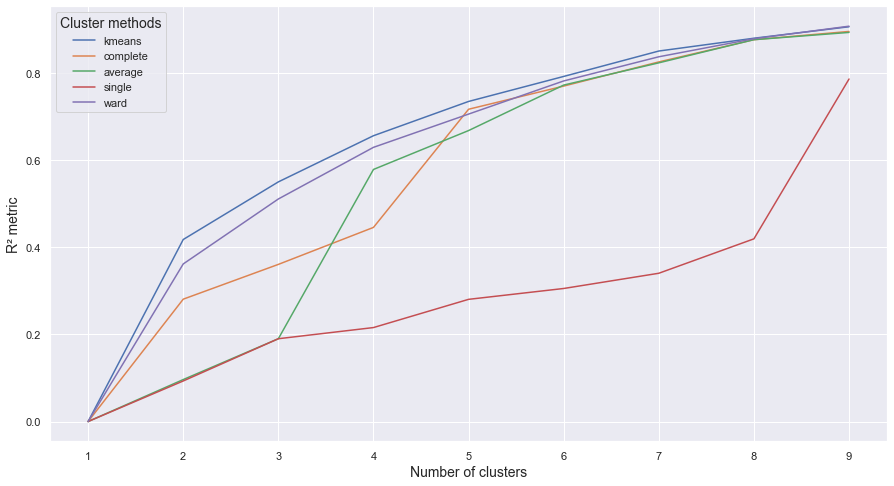

'R² plot for various clustering methods'

In [281]:
check_clustering_methods(data_to_cluster)


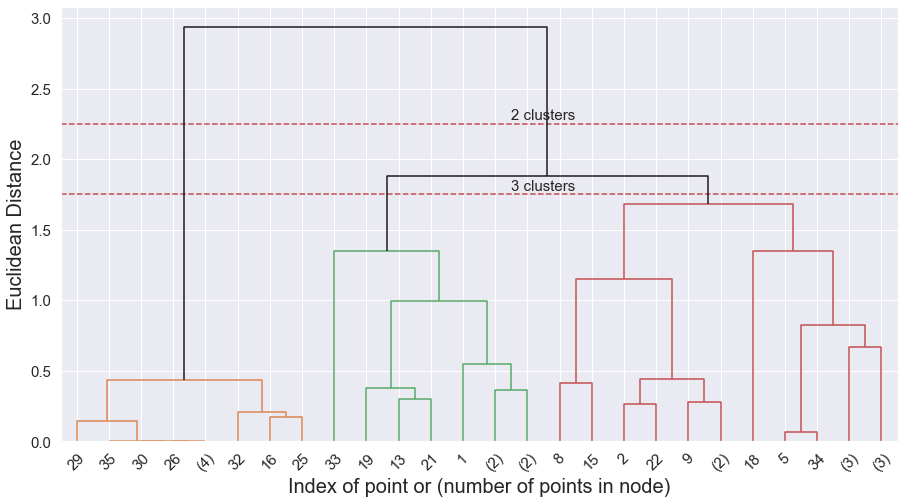

"Dendrogram - Hierarchical Clustering using Ward's linkage"

In [282]:
agglom_clustering_full(data_to_cluster, y_threshold_1 = 2.25, y_threshold_2 = 1.75)


### Find 2 clusters

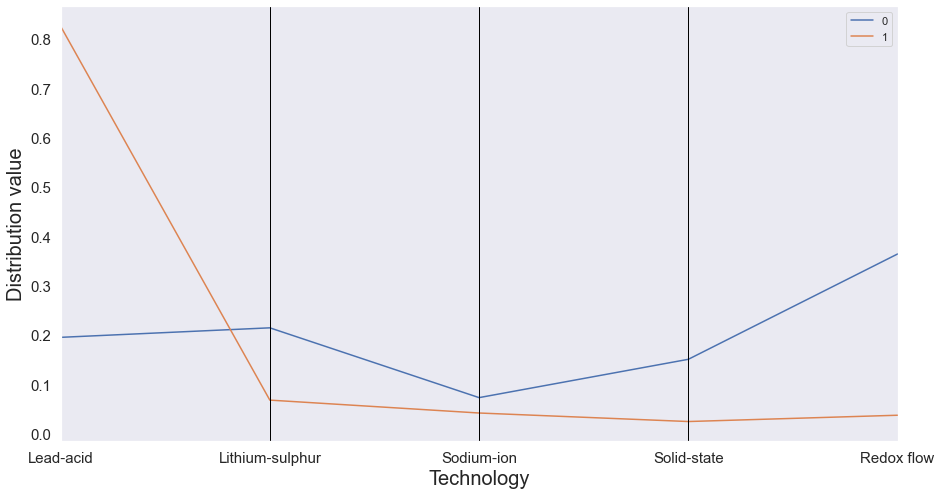

Cluster profiles


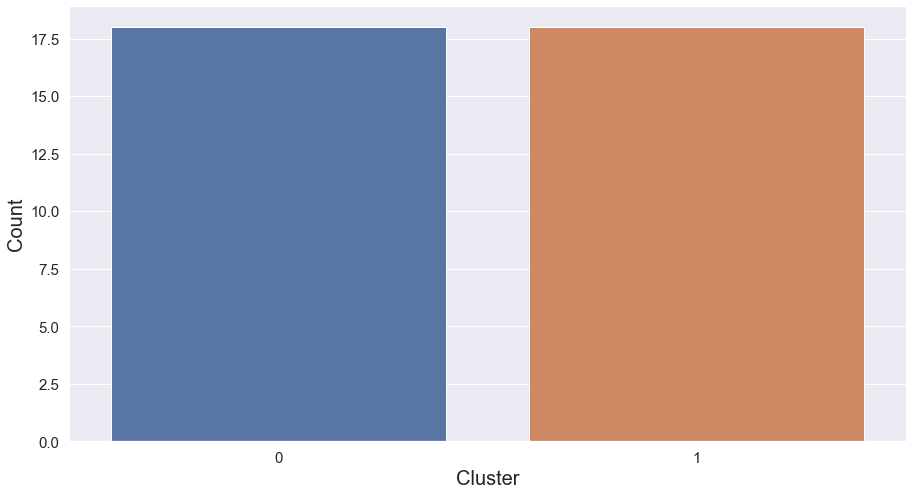

Counts per cluster


In [283]:
result_normalised_2000_2019_k_2, result_absolute_2000_2019_k_2 = run_k_means(data_to_cluster, data_normalised, data_absolute, False, n_clusters=2)

result_normalised = result_normalised_2000_2019_k_2
result_absolute = result_absolute_2000_2019_k_2

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [284]:
if False:
    
    result_normalised_2000_2019_h_2, result_absolute_2000_2019_h_2 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=2)

    result_normalised = result_normalised_2000_2019_h_2
    result_absolute = result_absolute_2000_2019_h_2

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


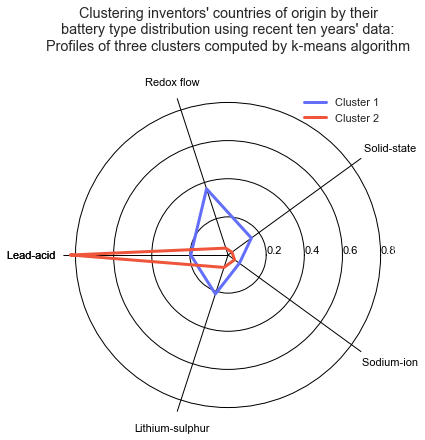

In [285]:
centroids_2 = cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [286]:
centroids_2


{0: [0.19568359284633774,
  0.21497155158448567,
  0.07355129046405551,
  0.15119486902910168,
  0.36459869607601947,
  0.19568359284633774],
 1: [0.8261281649338021,
  0.06851200706763982,
  0.042377378633309544,
  0.025110207253760883,
  0.037872242111487556,
  0.8261281649338021]}

In [287]:
show_result(0)


18
['Japan', 'USA', 'South Korea', 'China', 'Germany', 'UK', 'France', 'Canada', 'Italy', 'Taiwan', 'Belgium', 'Austria', 'Netherlands', 'Spain', 'Australia', 'Thailand', 'Switzerland', 'Hong Kong']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,0
US,136.911719,61.510281,22.516071,61.228175,208.145884,0
KR,19.000000,110.203530,28.179762,67.334774,149.934774,0
CN,59.266667,79.015868,29.627381,16.881548,59.923486,0
DE,28.391958,50.482900,2.291667,18.250000,58.630592,0
GB,4.771251,20.436869,10.958333,4.732143,16.289683,0
FR,7.696154,18.472222,8.767532,7.486111,6.615079,0
CA,6.692857,5.283333,4.928571,0.777778,5.983987,0
IT,10.250000,2.771429,0.000000,0.750000,6.854545,0
TW,4.500000,1.555556,0.750000,3.229167,9.000000,0


In [288]:
show_result(1)


18
['India', 'Israel', 'Russia', 'Turkey', 'Bulgaria', 'New Zealand', 'Luxembourg', 'Poland', 'Sweden', 'Malta', 'Mexico', 'North Korea', 'Kazakhstan', 'Norway', 'Hungary', 'Ukraine', 'Serbia', 'Greece']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
IN,10.522233,0.944444,0.830357,1.531746,0.815657,1
IL,4.250000,0.600000,0.750000,1.000000,1.000000,1
RU,5.000000,0.281385,0.000000,0.625000,0.976190,1
TR,5.000000,0.125000,0.500000,0.000000,1.125000,1
BG,5.571429,0.000000,0.000000,0.000000,0.000000,1
NZ,5.000000,0.000000,0.000000,0.000000,0.000000,1
LU,3.666667,0.000000,0.000000,0.000000,0.000000,1
PL,3.250000,0.266667,0.000000,0.000000,0.000000,1
SE,3.000000,0.000000,0.000000,0.000000,0.000000,1
MT,1.300000,0.000000,0.000000,0.000000,0.000000,1


### Find 3 clusters

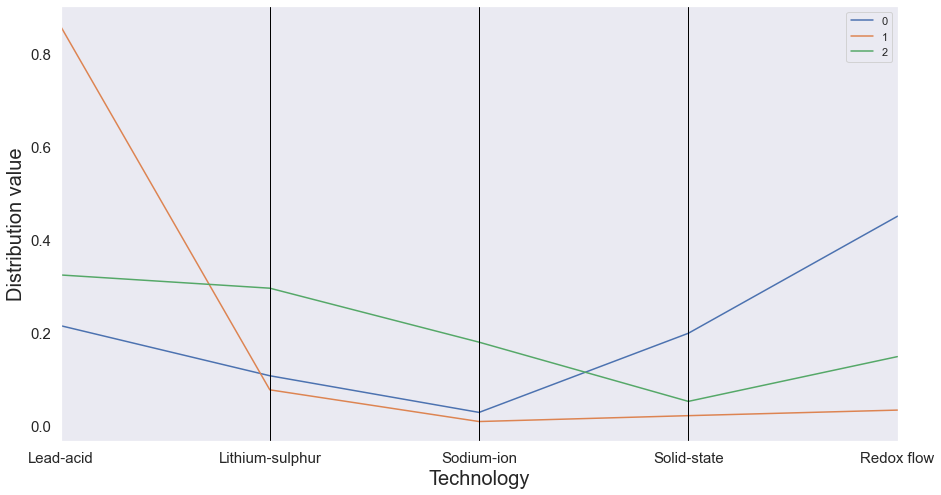

Cluster profiles


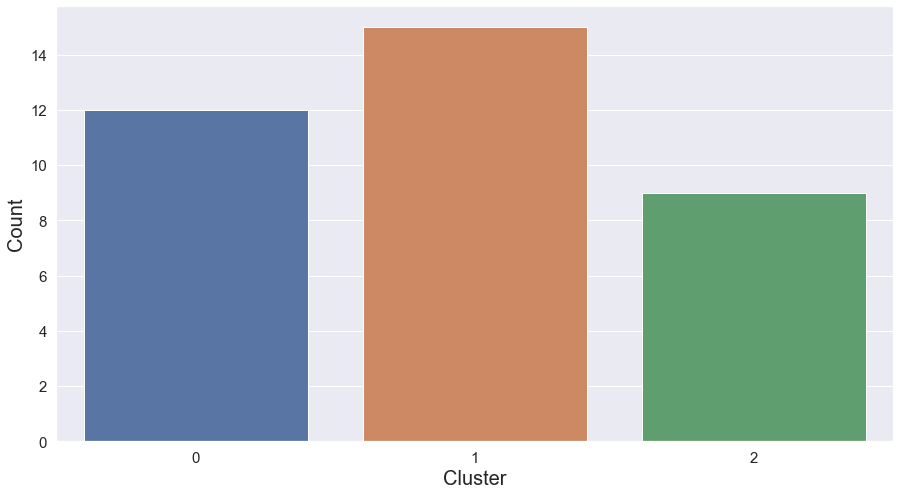

Counts per cluster


In [289]:
result_normalised_2000_2019_k_3, result_absolute_2000_2019_k_3 = run_k_means(data_to_cluster, data_normalised, data_absolute, False, n_clusters=3)

result_normalised = result_normalised_2000_2019_k_3
result_absolute = result_absolute_2000_2019_k_3

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


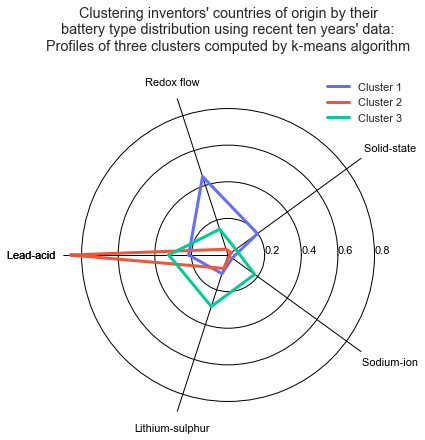

In [290]:
centroids_3 = cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.77, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)

## Run this n times and check which countries are always clustered together

In [291]:
check = data_absolute.copy()
check['sum'] = check.sum(axis = 1)
check.sort_values('sum', ascending = False, inplace = True)
countries_descending = list(check.index)
sums = list(check['sum'])
#countries_descending


In [234]:
sum_dict = {}

for i in range(len(check)):
    
    sum_dict[countries_descending[i]] = sums[i]
    
#sum_dict


In [129]:
n = 10000

clusterings = []

for i in tqdm(range(n)):

    run_multiple_k_means_normalised, run_multiple_k_means_absolute = run_k_means(data_to_cluster, data_normalised, data_absolute, True, n_clusters=3)

    clustering = []
    for cluster in set(run_multiple_k_means_normalised['label']):

        index = set(run_multiple_k_means_normalised[run_multiple_k_means_normalised['label'] == cluster].index)
        clustering.append(index)

    clusterings.append(clustering)
    
#clusterings

  0%|          | 0/10000 [00:00<?, ?it/s]

In [130]:
# Get all co-occurrences
co_occurrences = set()

for clustering in clusterings:
    
    for cluster in clustering:
        
        for pair in it.product(cluster, cluster, repeat = 1):
            
            if pair[0] != pair[1]:
                
                co_occurrences.add(pair)
    
len(co_occurrences)


774

In [131]:
# Get all theoretically possible triples

all_countries = set(run_multiple_k_means_normalised.index)

possible_triples = set()

for triple in it.product(all_countries, all_countries, all_countries, repeat = 1):
            
    if (triple[0] != triple[1]) & (triple[0] != triple[2]) & (triple[1] != triple[2]):

        possible_triples.add(triple)
        
possible_triples = list(possible_triples)

len(possible_triples)


42840

In [132]:
# Get triples of countries that are always in their own separate cluster - these are triples that can be used as handles

never_occur_together = set()

for triple in possible_triples:
        
    pairs = []
    for pair in it.product(triple, triple, repeat = 1):
    
        if (pair[0] != pair[1]):
            pairs.append(pair)
        
    co_occurred = False
    for pair in pairs:
        
        if pair in co_occurrences:
            co_occurred = True
    
    if not co_occurred:
        never_occur_together.add(triple)
        
len(never_occur_together)
#never_occur_together


1092

In [133]:
for country in list(never_occur_together)[0]:
    
    if country in country_labels_dict:
        print(country, country_labels_dict[country])
    else:
        print(country, ctry_code_name_dict[country])
        
print(list(never_occur_together)[0])


TH Thailand
KP North Korea
CA Canada
('TH', 'KP', 'CA')


In [134]:
# Define handles
handles = ['TH', 'KP', 'CA']

n_before = len(run_multiple_k_means_normalised)
print(n_before)

neighbors = []

for i, clustering in enumerate(clusterings):
    
    for j, handle in enumerate(handles):
        
        for cluster in clustering:
                        
            if handle in cluster:
                
                if i == 0:

                    neighbors.append(cluster)

                else:
                    
                    neighbors[j] = neighbors[j].intersection(cluster)

n_after = 0

for neighborhood in neighbors:
    
    n_after += len(neighborhood)

print(n_after)

36
22


In [135]:
# Sort neighbors in descending according to their total count in these categories

neighbors_descending = [[], [], []]

for i, neighborhood in enumerate(neighbors):
    
    for country in countries_descending:
        
        if country in neighborhood:
            
            if country in country_labels_dict:
                neighbors_descending[i].append(country_labels_dict[country])
            else:
                neighbors_descending[i].append(ctry_code_name_dict[country])

neighbors_descending


[['USA',
  'Germany',
  'Taiwan',
  'Austria',
  'Netherlands',
  'Thailand',
  'Switzerland'],
 ['India',
  'Russia',
  'Turkey',
  'Bulgaria',
  'New Zealand',
  'Luxembourg',
  'Poland',
  'Sweden',
  'Malta',
  'Mexico',
  'North Korea',
  'Serbia',
  'Greece'],
 ['Canada', 'Spain']]

In [136]:
for neighborhood in neighbors_descending:
    
    print(', '.join(neighborhood)+' ('+str(len(neighborhood))+' countries).')
    print()
        

USA, Germany, Taiwan, Austria, Netherlands, Thailand, Switzerland (7 countries).

India, Russia, Turkey, Bulgaria, New Zealand, Luxembourg, Poland, Sweden, Malta, Mexico, North Korea, Serbia, Greece (13 countries).

Canada, Spain (2 countries).



## Compute each country's cluster affiliation distribution and build most probable clusters

In [292]:
handles

['TH', 'KP', 'CA']

In [138]:
counters = {}

print(handles)

for i, country in enumerate(all_countries):
    
    counter = {}
    for handle in handles:
        counter[handle] = 0
    
    for clustering in clusterings:
        
        for cluster in clustering:
            
            if country in cluster:
                
                for handle in handles:
                    
                    if handle in cluster:
                        
                        counter[handle] += 1
                        
    counters[country] = counter

distributions = {}
for country in list(counters):
    
    distributions[country] = []
    
for country in list(counters):
    
    for count in list(counters[country]):
                
        distributions[country].append(counters[country][count] / n)
    
handles_distributions = np.eye(3).tolist()

for i, handle in enumerate(handles):
    distributions[handle] = handles_distributions[i]
    
distributions


['TH', 'KP', 'CA']


{'CH': [1.0, 0.0, 0.0],
 'FR': [0.0025, 0.0, 0.9975],
 'IT': [0.8715, 0.1285, 0.0],
 'MT': [0.0, 1.0, 0.0],
 'TR': [0.0, 1.0, 0.0],
 'AU': [0.8715, 0.1285, 0.0],
 'GB': [0.0025, 0.0, 0.9975],
 'BG': [0.0, 1.0, 0.0],
 'RS': [0.0, 1.0, 0.0],
 'HU': [0.0137, 0.9574, 0.0289],
 'IL': [0.0042, 0.9053, 0.0905],
 'BE': [0.998, 0.0, 0.002],
 'KR': [0.9982, 0.0, 0.0018],
 'UA': [0.0, 0.0012, 0.9988],
 'JP': [0.998, 0.0, 0.002],
 'TW': [1.0, 0.0, 0.0],
 'AT': [1.0, 0.0, 0.0],
 'DE': [1.0, 0.0, 0.0],
 'LU': [0.0, 1.0, 0.0],
 'PL': [0.0, 1.0, 0.0],
 'KZ': [0.0219, 0.9285, 0.0496],
 'US': [1.0, 0.0, 0.0],
 'HK': [0.1245, 0.0, 0.8755],
 'ES': [0.0, 0.0, 1.0],
 'SE': [0.0, 1.0, 0.0],
 'MX': [0.0, 1.0, 0.0],
 'RU': [0.0, 1.0, 0.0],
 'KP': [0.0, 1.0, 0.0],
 'GR': [0.0, 1.0, 0.0],
 'NO': [0.0, 0.8854, 0.1146],
 'IN': [0.0, 1.0, 0.0],
 'TH': [1.0, 0.0, 0.0],
 'CN': [0.0443, 0.0, 0.9557],
 'CA': [0.0, 0.0, 1.0],
 'NZ': [0.0, 1.0, 0.0],
 'NL': [1.0, 0.0, 0.0]}

In [139]:
# Check if there are any leveled distributions (two values the same)

for country in list(distributions):
    
    distribution = distributions[country]
    
    for i,v1 in enumerate(distribution):
        for j,v2 in enumerate(distribution):
            if (i!=j) & (v1==v2) & ((v1!=0) & (v2!=0)):
                print(v1, v2)
                

In [140]:
most_prob_clusters = []
for i in range(len(handles)):
    most_prob_clusters.append([])
    
for country in list(distributions):
    
    distribution = distributions[country]
    max_ = max(distribution)
    
    max_index = distribution.index(max_)
    
    if country in country_labels_dict:
        country_written = country_labels_dict[country]
    else:
        country_written = ctry_code_name_dict[country]
                
    most_prob_clusters[max_index].append((country_written, max_, sum_dict[country]))
    
most_prob_clusters_sorted = []
for most_prob_cluster in most_prob_clusters:
    
    tuples = most_prob_cluster
    tuples = sorted(tuples, key=lambda tup: tup[2], reverse = True)
    tuples = sorted(tuples, key=lambda tup: tup[1], reverse = True)
    most_prob_clusters_sorted.append(tuples)

most_prob_clusters_sorted


[[('USA', 1.0, 490.3121301943671),
  ('Germany', 1.0, 158.0471167721168),
  ('Taiwan', 1.0, 19.03472222222222),
  ('Austria', 1.0, 13.865079365079366),
  ('Netherlands', 1.0, 13.065018315018314),
  ('Thailand', 1.0, 6.5),
  ('Switzerland', 1.0, 5.583333333333332),
  ('South Korea', 0.9982, 374.6528411546106),
  ('Japan', 0.998, 970.6965014719101),
  ('Belgium', 0.998, 16.476190476190474),
  ('Italy', 0.8715, 20.625974025974028),
  ('Australia', 0.8715, 6.679545454545456)],
 [('India', 1.0, 14.644437506937505),
  ('Russia', 1.0, 6.882575757575758),
  ('Turkey', 1.0, 6.75),
  ('Bulgaria', 1.0, 5.571428571428571),
  ('New Zealand', 1.0, 5.0),
  ('Luxembourg', 1.0, 3.6666666666666665),
  ('Poland', 1.0, 3.5166666666666666),
  ('Sweden', 1.0, 3.0),
  ('Malta', 1.0, 1.3),
  ('Mexico', 1.0, 1.2261904761904763),
  ('North Korea', 1.0, 1.1428571428571428),
  ('Serbia', 1.0, 0.20238095238095238),
  ('Greece', 1.0, 0.14358974358974358),
  ('Hungary', 0.9574, 0.55),
  ('Kazakhstan', 0.9285, 1.0),


## Create LaTeX code

In [299]:
latex_code = '\\begin{itemize}'

for i, cluster in enumerate(most_prob_clusters_sorted):
    
    string_ = '\n\item Cluster '+str(i + 1)+' ('+str(len(cluster))+' countries):\n\n'
    
    for j, tuple_ in enumerate(cluster):
                
        prob = tuple_[1]
        
        if prob == 1:
            string_ = string_+'\colorbox{rb100}{\hz '+tuple_[0]+'}'
        elif (prob < 1) & (prob >= 0.95):
            string_ = string_+'\colorbox{rb70}{\hz '+tuple_[0]+'}'
        elif (prob < 0.95) & (prob >= 0.9):
            string_ = string_+'\colorbox{rb30}{\hz '+tuple_[0]+'}'
        elif (prob < 0.9) & (prob >= 0.85):
            string_ = string_+'\colorbox{rb0}{\hz '+tuple_[0]+'}'
        else:
            print('######################')
            print('outside defined ranges')
            print('######################')
            
        
        if j < len(cluster) - 1:
            string_ += ', '
        else:
            string_ += '.'
        
    latex_code += '\n'+string_
                
latex_code += '\n\n\end{itemize}'
print(latex_code)
        

\begin{itemize}

\item Cluster 1 (12 countries):

\colorbox{rb100}{\hz USA}, \colorbox{rb100}{\hz Germany}, \colorbox{rb100}{\hz Taiwan}, \colorbox{rb100}{\hz Austria}, \colorbox{rb100}{\hz Netherlands}, \colorbox{rb100}{\hz Thailand}, \colorbox{rb100}{\hz Switzerland}, \colorbox{rb70}{\hz South Korea}, \colorbox{rb70}{\hz Japan}, \colorbox{rb70}{\hz Belgium}, \colorbox{rb0}{\hz Italy}, \colorbox{rb0}{\hz Australia}.

\item Cluster 2 (17 countries):

\colorbox{rb100}{\hz India}, \colorbox{rb100}{\hz Russia}, \colorbox{rb100}{\hz Turkey}, \colorbox{rb100}{\hz Bulgaria}, \colorbox{rb100}{\hz New Zealand}, \colorbox{rb100}{\hz Luxembourg}, \colorbox{rb100}{\hz Poland}, \colorbox{rb100}{\hz Sweden}, \colorbox{rb100}{\hz Malta}, \colorbox{rb100}{\hz Mexico}, \colorbox{rb100}{\hz North Korea}, \colorbox{rb100}{\hz Serbia}, \colorbox{rb100}{\hz Greece}, \colorbox{rb70}{\hz Hungary}, \colorbox{rb30}{\hz Kazakhstan}, \colorbox{rb30}{\hz Israel}, \colorbox{rb0}{\hz Norway}.

\item Cluster 3 (7 c

In [174]:
if False:
    
    result_normalised_2000_2019_h_3, result_absolute_2000_2019_h_3 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=3)

    result_normalised = result_normalised_2000_2019_h_3
    result_absolute = result_absolute_2000_2019_h_3

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


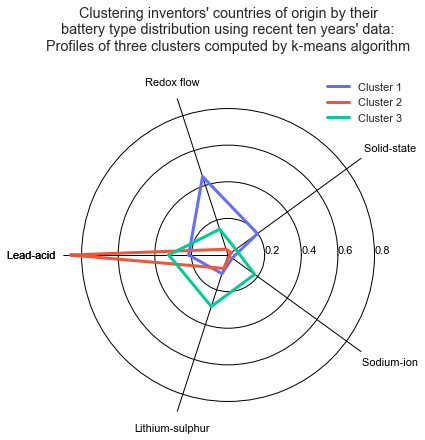

In [373]:
centroids_3 = cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.77, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [235]:
show_result(0)


6
['Bulgaria', 'New Zealand', 'Luxembourg', 'North Korea', 'Malta', 'Serbia']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
BG,5.571429,0.0,0.174242,0.0,0.000000,0.0,0
NZ,5.000000,0.0,0.000000,0.0,0.000000,0.0,0
LU,3.666667,0.0,1.015079,0.0,0.000000,0.0,0
KP,1.000000,0.0,0.415909,0.0,0.142857,0.0,0
MT,1.300000,0.0,0.000000,0.0,0.000000,0.0,0
RS,0.202381,0.0,0.066667,0.0,0.000000,0.0,0


In [236]:
list_ = ['Japan', 'USA', 'South Korea', 'Germany', 'Italy', 'Taiwan', 'Belgium', 'Austria', 'Netherlands', 'Australia', 'Thailand', 'Switzerland']
print(', '.join(list_)+' ('+str(len(list_))+' countries).')


Japan, USA, South Korea, Germany, Italy, Taiwan, Belgium, Austria, Netherlands, Australia, Thailand, Switzerland (12 countries).


In [237]:
show_result(1)


20
['Japan', 'China', 'USA', 'South Korea', 'Germany', 'France', 'Taiwan', 'Canada', 'Belgium', 'India', 'Switzerland', 'Israel', 'Russia', 'Hong Kong', 'Norway', 'Sweden', 'South Africa', 'Ukraine', 'Malaysia', 'Greece']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,3183.315045,87.932143,434.247368,216.770263,1
CN,59.266667,79.015868,1180.048959,29.627381,16.881548,59.923486,1
US,136.911719,61.510281,820.516713,22.516071,61.228175,208.145884,1
KR,19.000000,110.203530,580.588284,28.179762,67.334774,149.934774,1
DE,28.391958,50.482900,571.611526,2.291667,18.250000,58.630592,1
FR,7.696154,18.472222,136.328945,8.767532,7.486111,6.615079,1
TW,4.500000,1.555556,93.596429,0.750000,3.229167,9.000000,1
CA,6.692857,5.283333,55.929077,4.928571,0.777778,5.983987,1
BE,1.000000,0.000000,29.239341,0.000000,15.476190,0.000000,1
IN,10.522233,0.944444,25.590148,0.830357,1.531746,0.815657,1


In [238]:
list_ = ['India', 'Russia', 'Turkey', 'Bulgaria', 'New Zealand', 'Luxembourg', 'Poland', 'Sweden', 'Malta', 'Mexico', "Democratic People's Republic of Korea", 'Kazakhstan', 'Hungary', 'Serbia', 'Greece']
print(', '.join(list_)+' ('+str(len(list_))+' countries).')


India, Russia, Turkey, Bulgaria, New Zealand, Luxembourg, Poland, Sweden, Malta, Mexico, Democratic People's Republic of Korea, Kazakhstan, Hungary, Serbia, Greece (15 countries).


In [239]:
show_result(2)


12
['UK', 'Italy', 'Austria', 'Spain', 'Netherlands', 'Turkey', 'Australia', 'Poland', 'Thailand', 'Mexico', 'Kazakhstan', 'Hungary']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
GB,4.771251,20.436869,58.600790,10.958333,4.732143,16.289683,2
IT,10.250000,2.771429,17.747727,0.000000,0.750000,6.854545,2
AT,2.000000,0.916667,14.759061,0.000000,1.000000,9.948413,2
ES,1.750000,3.000000,7.971995,2.818182,0.000000,2.357143,2
NL,6.000000,0.000000,4.547619,0.000000,1.571429,5.493590,2
TR,5.000000,0.125000,3.861111,0.500000,0.000000,1.125000,2
AU,3.179545,1.500000,3.715812,0.000000,0.000000,2.000000,2
PL,3.250000,0.266667,4.000000,0.000000,0.000000,0.000000,2
TH,0.000000,0.000000,0.142857,0.000000,0.000000,6.500000,2
MX,1.059524,0.000000,1.416667,0.000000,0.000000,0.166667,2


In [240]:
list_ = ['China', 'UK', 'France', 'Canada', 'Spain', 'Israel', 'Norway', 'Hong Kong SAR (China)', 'Ukraine']
print(', '.join(list_)+' ('+str(len(list_))+' countries).')


China, UK, France, Canada, Spain, Israel, Norway, Hong Kong SAR (China), Ukraine (9 countries).


### Find 4 clusters

In [241]:
run_k_means


<function __main__.run_k_means(data_to_cluster, data_normalised, data_absolute, random, n_clusters=2)>

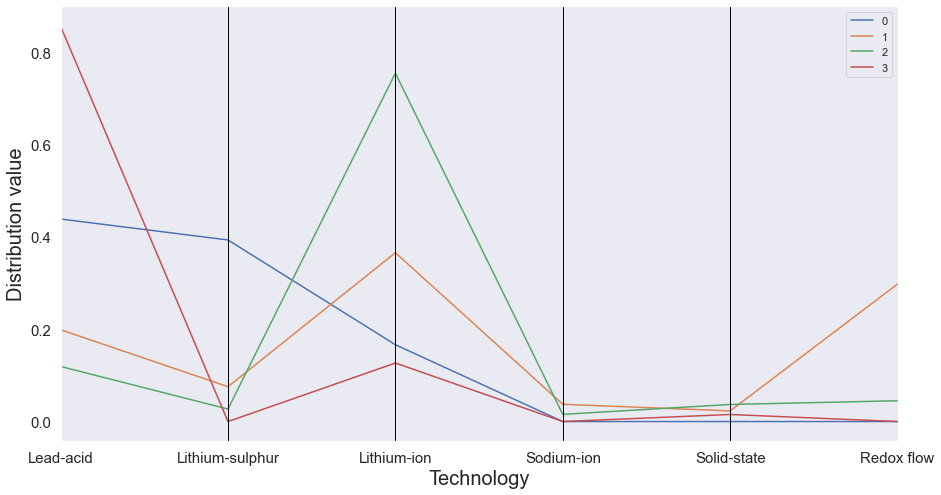

Cluster profiles


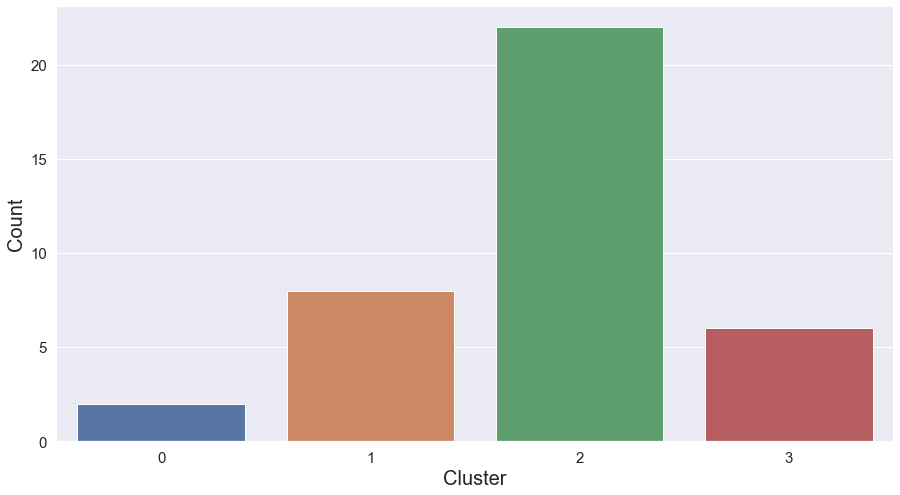

Counts per cluster


In [242]:
result_normalised_2000_2019_k_4, result_absolute_2000_2019_k_4 = run_k_means(
    data_to_cluster, data_normalised, data_absolute, False, n_clusters=4)

result_normalised = result_normalised_2000_2019_k_4
result_absolute = result_absolute_2000_2019_k_4

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [243]:
if False:
    
    result_normalised_2000_2019_h_4, result_absolute_2000_2019_h_4 = run_agglomerative(
        data_to_cluster, data_normalised, data_absolute, n_clusters=4)

    result_normalised = result_normalised_2000_2019_h_4
    result_absolute = result_absolute_2000_2019_h_4

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (7).

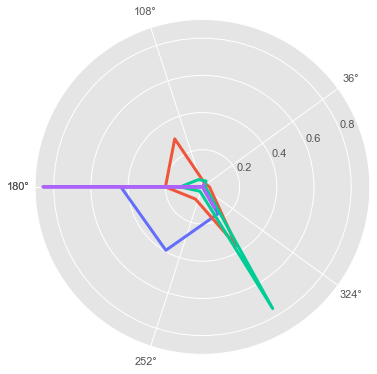

In [244]:
cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [245]:
show_result(0)


2
['Kazakhstan', 'Hungary']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
KZ,0.5,0.50,0.5,0.0,0.0,0.0,0
HU,0.3,0.25,0.0,0.0,0.0,0.0,0


In [246]:
show_result(1)


8
['UK', 'Italy', 'Austria', 'Spain', 'Netherlands', 'Turkey', 'Australia', 'Thailand']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
GB,4.771251,20.436869,58.600790,10.958333,4.732143,16.289683,1
IT,10.250000,2.771429,17.747727,0.000000,0.750000,6.854545,1
AT,2.000000,0.916667,14.759061,0.000000,1.000000,9.948413,1
ES,1.750000,3.000000,7.971995,2.818182,0.000000,2.357143,1
NL,6.000000,0.000000,4.547619,0.000000,1.571429,5.493590,1
TR,5.000000,0.125000,3.861111,0.500000,0.000000,1.125000,1
AU,3.179545,1.500000,3.715812,0.000000,0.000000,2.000000,1
TH,0.000000,0.000000,0.142857,0.000000,0.000000,6.500000,1


In [247]:
show_result(2)


22
['Japan', 'China', 'USA', 'South Korea', 'Germany', 'France', 'Taiwan', 'Canada', 'Belgium', 'India', 'Switzerland', 'Israel', 'Russia', 'Hong Kong', 'Norway', 'Sweden', 'Poland', 'South Africa', 'Mexico', 'Ukraine', 'Malaysia', 'Greece']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,3183.315045,87.932143,434.247368,216.770263,2
CN,59.266667,79.015868,1180.048959,29.627381,16.881548,59.923486,2
US,136.911719,61.510281,820.516713,22.516071,61.228175,208.145884,2
KR,19.000000,110.203530,580.588284,28.179762,67.334774,149.934774,2
DE,28.391958,50.482900,571.611526,2.291667,18.250000,58.630592,2
FR,7.696154,18.472222,136.328945,8.767532,7.486111,6.615079,2
TW,4.500000,1.555556,93.596429,0.750000,3.229167,9.000000,2
CA,6.692857,5.283333,55.929077,4.928571,0.777778,5.983987,2
BE,1.000000,0.000000,29.239341,0.000000,15.476190,0.000000,2
IN,10.522233,0.944444,25.590148,0.830357,1.531746,0.815657,2


In [248]:
show_result(3)


6
['Bulgaria', 'New Zealand', 'Luxembourg', 'North Korea', 'Malta', 'Serbia']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
BG,5.571429,0.0,0.174242,0.0,0.000000,0.0,3
NZ,5.000000,0.0,0.000000,0.0,0.000000,0.0,3
LU,3.666667,0.0,1.015079,0.0,0.000000,0.0,3
KP,1.000000,0.0,0.415909,0.0,0.142857,0.0,3
MT,1.300000,0.0,0.000000,0.0,0.000000,0.0,3
RS,0.202381,0.0,0.066667,0.0,0.000000,0.0,3


### Find 5 clusters

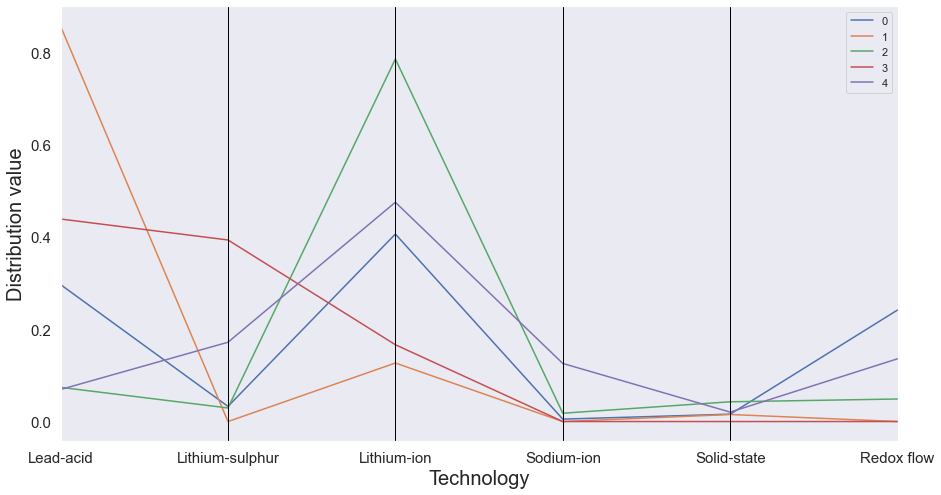

Cluster profiles


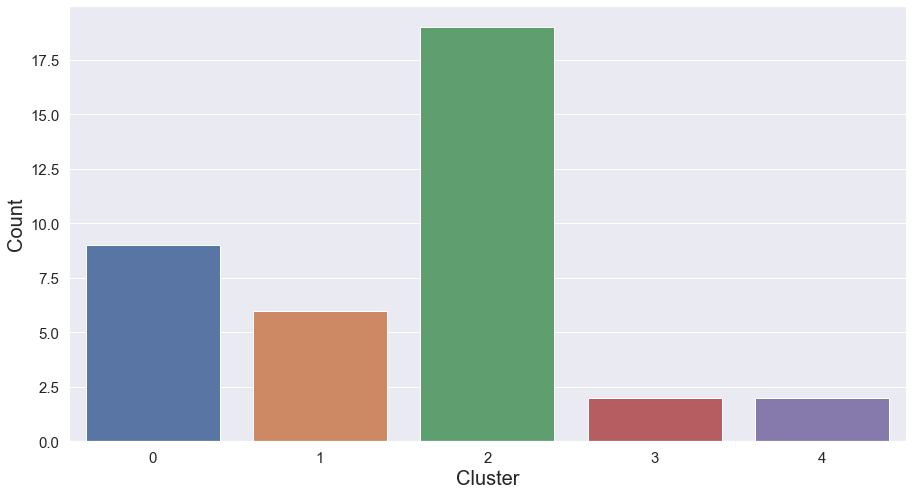

Counts per cluster


In [249]:
result_normalised_2000_2019_k_5, result_absolute_2000_2019_k_5 = run_k_means(
    data_to_cluster, data_normalised, data_absolute, False, n_clusters=5)

result_normalised = result_normalised_2000_2019_k_5
result_absolute = result_absolute_2000_2019_k_5

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [250]:
if False:
    
    result_normalised_2000_2019_h_5, result_absolute_2000_2019_h_5 = run_agglomerative(
        data_to_cluster, data_normalised, data_absolute, n_clusters=5)

    result_normalised = result_normalised_2000_2019_h_5
    result_absolute = result_absolute_2000_2019_h_5

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (7).

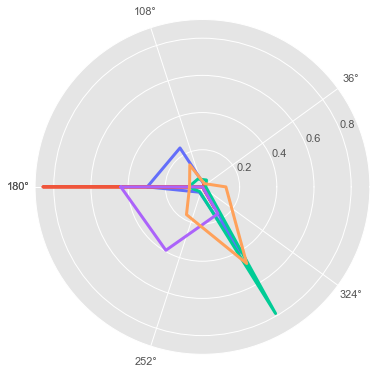

In [251]:
cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [256]:
show_result(0)


9
['Italy', 'Austria', 'Netherlands', 'Turkey', 'Australia', 'Sweden', 'Poland', 'Thailand', 'Mexico']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
IT,10.250000,2.771429,17.747727,0.0,0.750000,6.854545,0
AT,2.000000,0.916667,14.759061,0.0,1.000000,9.948413,0
NL,6.000000,0.000000,4.547619,0.0,1.571429,5.493590,0
TR,5.000000,0.125000,3.861111,0.5,0.000000,1.125000,0
AU,3.179545,1.500000,3.715812,0.0,0.000000,2.000000,0
SE,3.000000,0.000000,4.767857,0.0,0.000000,0.000000,0
PL,3.250000,0.266667,4.000000,0.0,0.000000,0.000000,0
TH,0.000000,0.000000,0.142857,0.0,0.000000,6.500000,0
MX,1.059524,0.000000,1.416667,0.0,0.000000,0.166667,0


In [257]:
show_result(1)


6
['Bulgaria', 'New Zealand', 'Luxembourg', 'North Korea', 'Malta', 'Serbia']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
BG,5.571429,0.0,0.174242,0.0,0.000000,0.0,1
NZ,5.000000,0.0,0.000000,0.0,0.000000,0.0,1
LU,3.666667,0.0,1.015079,0.0,0.000000,0.0,1
KP,1.000000,0.0,0.415909,0.0,0.142857,0.0,1
MT,1.300000,0.0,0.000000,0.0,0.000000,0.0,1
RS,0.202381,0.0,0.066667,0.0,0.000000,0.0,1


In [253]:
show_result(2)


19
['Japan', 'China', 'USA', 'South Korea', 'Germany', 'France', 'Taiwan', 'Canada', 'Belgium', 'India', 'Switzerland', 'Israel', 'Russia', 'Hong Kong', 'Norway', 'South Africa', 'Ukraine', 'Malaysia', 'Greece']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,3183.315045,87.932143,434.247368,216.770263,2
CN,59.266667,79.015868,1180.048959,29.627381,16.881548,59.923486,2
US,136.911719,61.510281,820.516713,22.516071,61.228175,208.145884,2
KR,19.000000,110.203530,580.588284,28.179762,67.334774,149.934774,2
DE,28.391958,50.482900,571.611526,2.291667,18.250000,58.630592,2
FR,7.696154,18.472222,136.328945,8.767532,7.486111,6.615079,2
TW,4.500000,1.555556,93.596429,0.750000,3.229167,9.000000,2
CA,6.692857,5.283333,55.929077,4.928571,0.777778,5.983987,2
BE,1.000000,0.000000,29.239341,0.000000,15.476190,0.000000,2
IN,10.522233,0.944444,25.590148,0.830357,1.531746,0.815657,2


In [254]:
show_result(3)


2
['Kazakhstan', 'Hungary']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
KZ,0.5,0.50,0.5,0.0,0.0,0.0,3
HU,0.3,0.25,0.0,0.0,0.0,0.0,3


In [255]:
show_result(4)


2
['UK', 'Spain']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
GB,4.771251,20.436869,58.600790,10.958333,4.732143,16.289683,4
ES,1.750000,3.000000,7.971995,2.818182,0.000000,2.357143,4


### Find 6 clusters

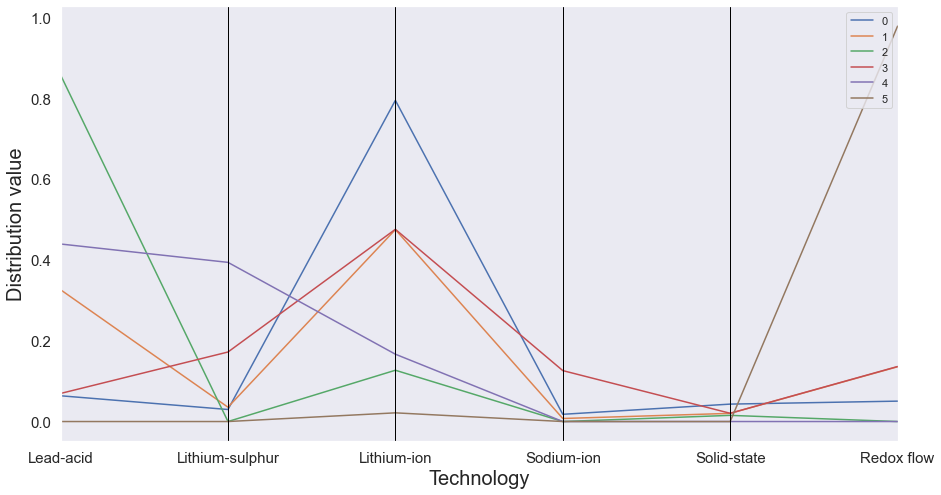

Cluster profiles


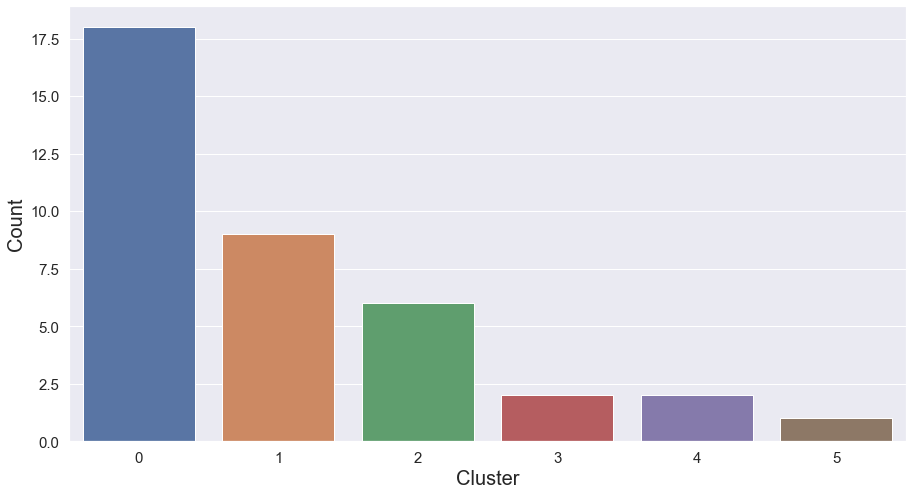

Counts per cluster


In [259]:
result_normalised_2000_2019_k_6, result_absolute_2000_2019_k_6 = run_k_means(
    data_to_cluster, data_normalised, data_absolute, False, n_clusters=6)

result_normalised = result_normalised_2000_2019_k_6
result_absolute = result_absolute_2000_2019_k_6

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [260]:
if False:
    
    result_normalised_2000_2019_h_6, result_absolute_2000_2019_h_6 = run_agglomerative(
        data_to_cluster, data_normalised, data_absolute, n_clusters=6)

    result_normalised = result_normalised_2000_2019_h_6
    result_absolute = result_absolute_2000_2019_h_6

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (7).

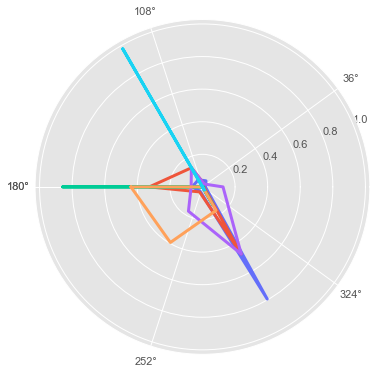

In [261]:
cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [ ]:
show_result(0)


In [262]:
show_result(1)


9
['India', 'Italy', 'Austria', 'Netherlands', 'Turkey', 'Australia', 'Sweden', 'Poland', 'Mexico']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
IN,10.522233,0.944444,25.590148,0.830357,1.531746,0.815657,1
IT,10.250000,2.771429,17.747727,0.000000,0.750000,6.854545,1
AT,2.000000,0.916667,14.759061,0.000000,1.000000,9.948413,1
NL,6.000000,0.000000,4.547619,0.000000,1.571429,5.493590,1
TR,5.000000,0.125000,3.861111,0.500000,0.000000,1.125000,1
AU,3.179545,1.500000,3.715812,0.000000,0.000000,2.000000,1
SE,3.000000,0.000000,4.767857,0.000000,0.000000,0.000000,1
PL,3.250000,0.266667,4.000000,0.000000,0.000000,0.000000,1
MX,1.059524,0.000000,1.416667,0.000000,0.000000,0.166667,1


In [263]:
show_result(2)


6
['Bulgaria', 'New Zealand', 'Luxembourg', 'North Korea', 'Malta', 'Serbia']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
BG,5.571429,0.0,0.174242,0.0,0.000000,0.0,2
NZ,5.000000,0.0,0.000000,0.0,0.000000,0.0,2
LU,3.666667,0.0,1.015079,0.0,0.000000,0.0,2
KP,1.000000,0.0,0.415909,0.0,0.142857,0.0,2
MT,1.300000,0.0,0.000000,0.0,0.000000,0.0,2
RS,0.202381,0.0,0.066667,0.0,0.000000,0.0,2


In [264]:
show_result(3)


2
['UK', 'Spain']


,Lead-acid,Lithium-sulphur,Lithium-ion,Sodium-ion,Solid-state,Redox flow,label
GB,4.771251,20.436869,58.600790,10.958333,4.732143,16.289683,3
ES,1.750000,3.000000,7.971995,2.818182,0.000000,2.357143,3


In [96]:
show_result(4)


5
['China', 'UK', 'France', 'Canada', 'Spain']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
CN,59.266667,79.015868,29.627381,16.881548,59.923486,4
GB,4.771251,20.436869,10.958333,4.732143,16.289683,4
FR,7.696154,18.472222,8.767532,7.486111,6.615079,4
CA,6.692857,5.283333,4.928571,0.777778,5.983987,4
ES,1.750000,3.000000,2.818182,0.000000,2.357143,4


In [97]:
show_result(5)


2
['Japan', 'Belgium']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,5
BE,1.000000,0.000000,0.000000,15.476190,0.000000,5


### 1999-2008 and 2009-2018 / 2000-2009 and 2010-2019


In [468]:
time_periods_list = [[2000,2009], [2010,2019]]
#time_periods_list = [[1999,2008], [2009,2018]]

time_periods_list


[[2000, 2009], [2010, 2019]]

In [349]:
tech_dist_dfs_absolute_list_2000_2010_2019 = get_tech_dist_dfs_absolute_list(time_periods_list, dfs_technologies_list)
#tech_dist_dfs_absolute_list_2000_2010_2019[0]


In [350]:
#len(tech_dist_dfs_absolute_list_2000_2010_2019[1])
len(tech_dist_dfs_absolute_list_2000_2010_2019[0])


42

In [351]:
tech_dist_dfs_normalised_list_2000_2010_2019 = get_tech_dist_dfs_normalised_list(
    tech_dist_dfs_absolute_list_2000_2010_2019
)
#tech_dist_dfs_normalised_list_2000_2010_2019[0]


In [352]:
#len(tech_dist_dfs_normalised_list_2000_2010_2019[1])
len(tech_dist_dfs_normalised_list_2000_2010_2019[0])


36

In [353]:
tech_dist_dfs_normalised_scaled_list_2000_2010_2019 = get_tech_dist_dfs_normalised_scaled_list(
    tech_dist_dfs_normalised_list_2000_2010_2019
)
#tech_dist_dfs_normalised_scaled_list_2000_2010_2019[0]


In [354]:
if False:
    
    print(list(tech_dist_dfs_absolute_list_2000_2010_2019[0].index) == list(tech_dist_dfs_absolute_list_2000_2010_2019[1].index))

    print(list(tech_dist_dfs_normalised_list_2000_2010_2019[0].index) == list(tech_dist_dfs_normalised_list_2000_2010_2019[1].index))

    print(list(tech_dist_dfs_normalised_scaled_list_2000_2010_2019[0].index) == list(tech_dist_dfs_normalised_scaled_list_2000_2010_2019[1].index))


### 1999-2008 / 2000-2009

In [409]:
data_absolute, data_normalised, data_to_cluster = get_dataframes(0,
                                                                tech_dist_dfs_absolute_list_2000_2010_2019,
                                                                tech_dist_dfs_normalised_list_2000_2010_2019,
                                                                tech_dist_dfs_normalised_scaled_list_2000_2010_2019)


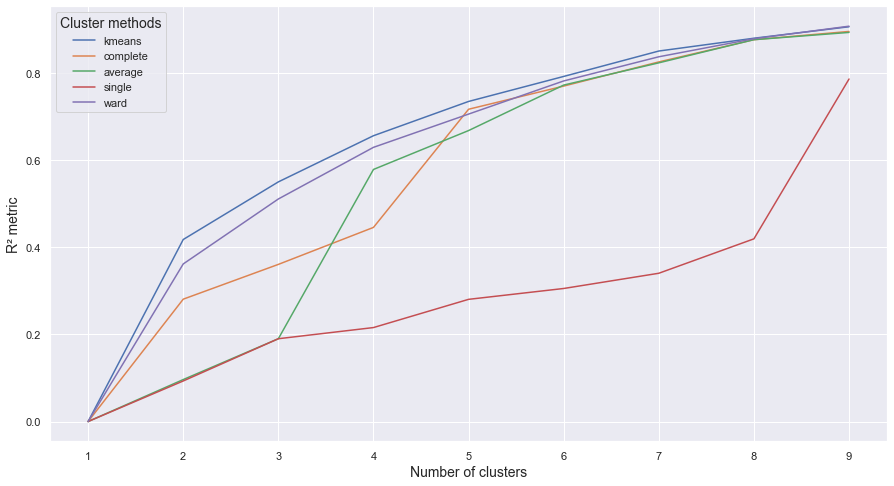

'R² plot for various clustering methods'

In [410]:
check_clustering_methods(data_to_cluster)


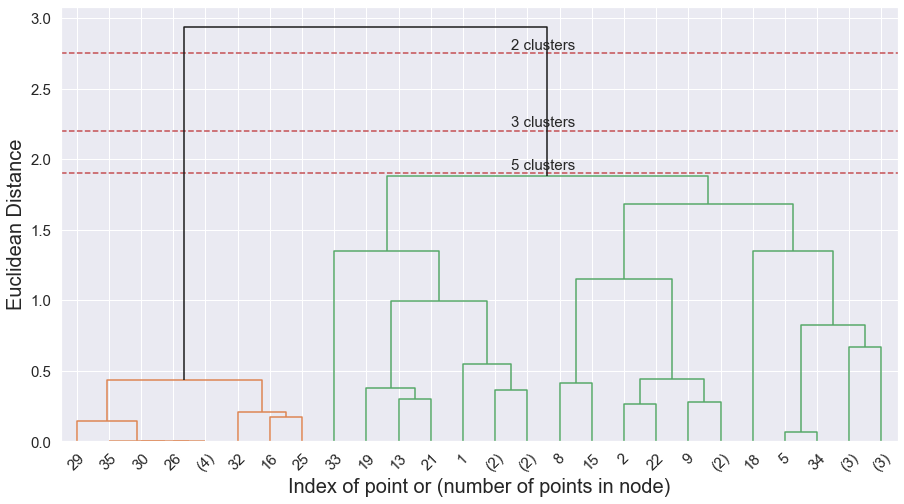

"Dendrogram - Hierarchical Clustering using Ward's linkage"

In [411]:
agglom_clustering_full(data_to_cluster, 2.75, 2.2, 1.9)


### Find 2 clusters

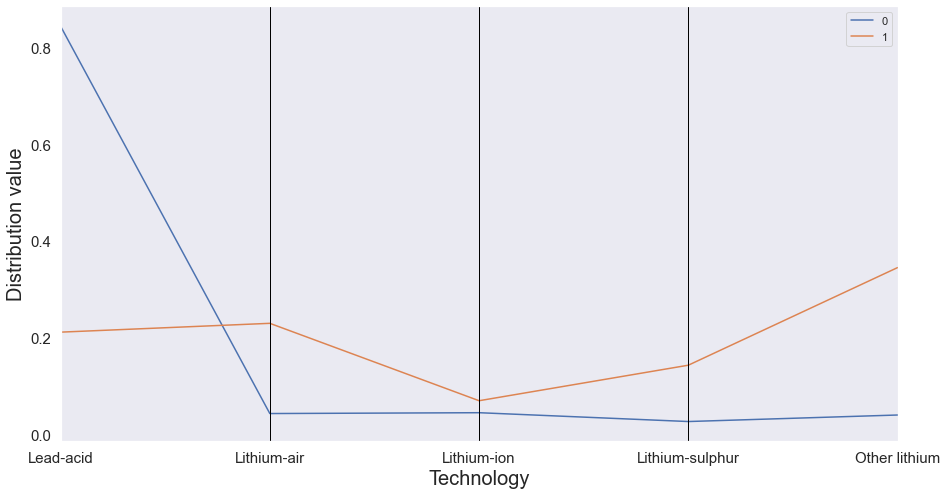

Cluster profiles


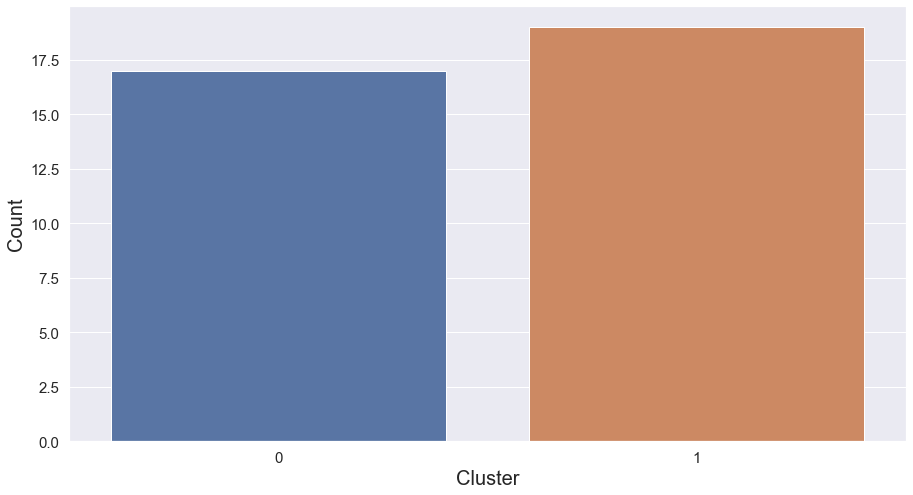

Counts per cluster


In [412]:
result_normalised_2000_2009_k_2, result_absolute_2000_2009_k_2 = run_k_means(data_to_cluster, data_normalised, data_absolute, n_clusters=2)

result_normalised = result_normalised_2000_2009_k_2
result_absolute = result_absolute_2000_2009_k_2

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


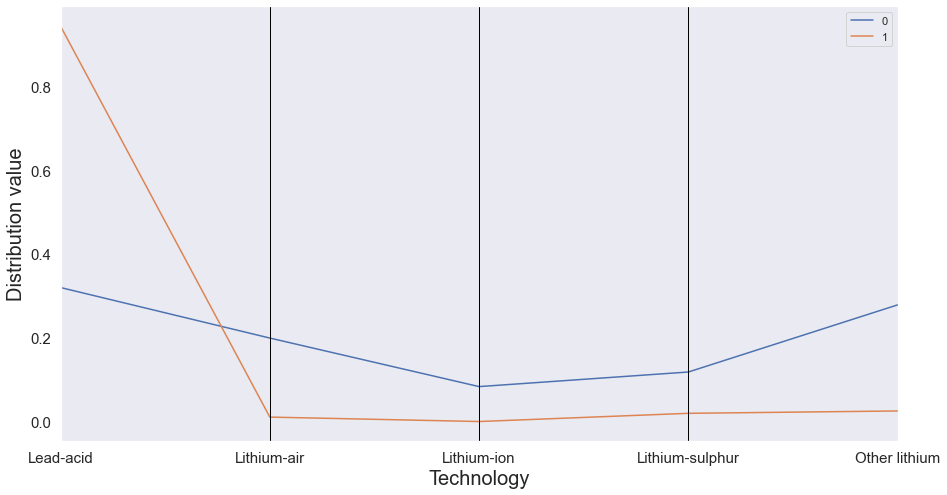

Cluster profiles


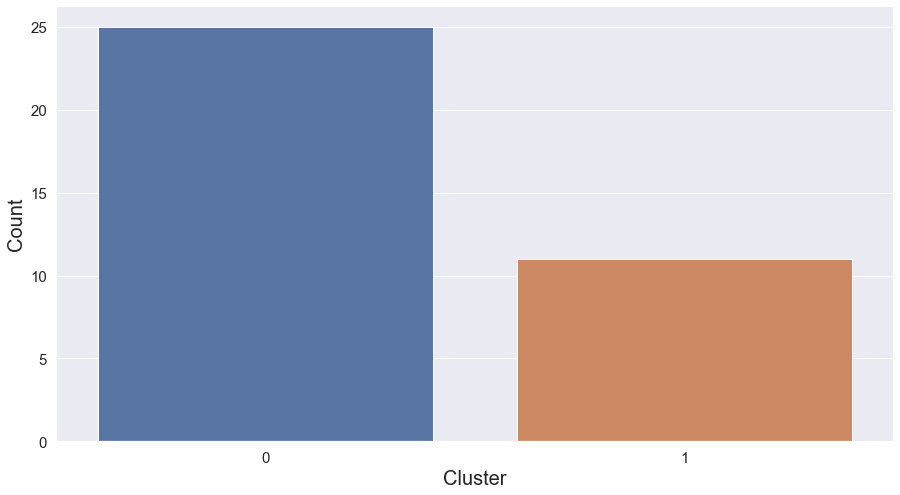

Counts per cluster


In [413]:
result_normalised_2000_2009_h_2, result_absolute_2000_2009_h_2 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=2)

result_normalised = result_normalised_2000_2009_h_2
result_absolute = result_absolute_2000_2009_h_2

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [414]:
show_result(0)


25
['Japan', 'USA', 'South Korea', 'China', 'Germany', 'UK', 'France', 'Canada', 'Italy', 'Taiwan', 'Belgium', 'India', 'Austria', 'Netherlands', 'Spain', 'Israel', 'Turkey', 'Australia', 'Thailand', 'Switzerland', 'Kazakhstan', 'Norway', 'Hungary', 'Hong Kong SAR (China)', 'Ukraine']


,Lead-acid,Lithium-air,Lithium-ion,Lithium-sulphur,Other lithium,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,0
US,136.911719,61.510281,22.516071,61.228175,208.145884,0
KR,19.000000,110.203530,28.179762,67.334774,149.934774,0
CN,59.266667,79.015868,29.627381,16.881548,59.923486,0
DE,28.391958,50.482900,2.291667,18.250000,58.630592,0
GB,4.771251,20.436869,10.958333,4.732143,16.289683,0
FR,7.696154,18.472222,8.767532,7.486111,6.615079,0
CA,6.692857,5.283333,4.928571,0.777778,5.983987,0
IT,10.250000,2.771429,0.000000,0.750000,6.854545,0
TW,4.500000,1.555556,0.750000,3.229167,9.000000,0


In [415]:
show_result(1)


11
['Russia', 'Bulgaria', 'New Zealand', 'Luxembourg', 'Poland', 'Sweden', 'Malta', 'Mexico', "Democratic People's Republic of Korea", 'Serbia', 'Greece']


,Lead-acid,Lithium-air,Lithium-ion,Lithium-sulphur,Other lithium,label
RU,5.000000,0.281385,0.0,0.625000,0.976190,1
BG,5.571429,0.000000,0.0,0.000000,0.000000,1
NZ,5.000000,0.000000,0.0,0.000000,0.000000,1
LU,3.666667,0.000000,0.0,0.000000,0.000000,1
PL,3.250000,0.266667,0.0,0.000000,0.000000,1
SE,3.000000,0.000000,0.0,0.000000,0.000000,1
MT,1.300000,0.000000,0.0,0.000000,0.000000,1
MX,1.059524,0.000000,0.0,0.000000,0.166667,1
KP,1.000000,0.000000,0.0,0.142857,0.000000,1
RS,0.202381,0.000000,0.0,0.000000,0.000000,1


### Find 3 clusters

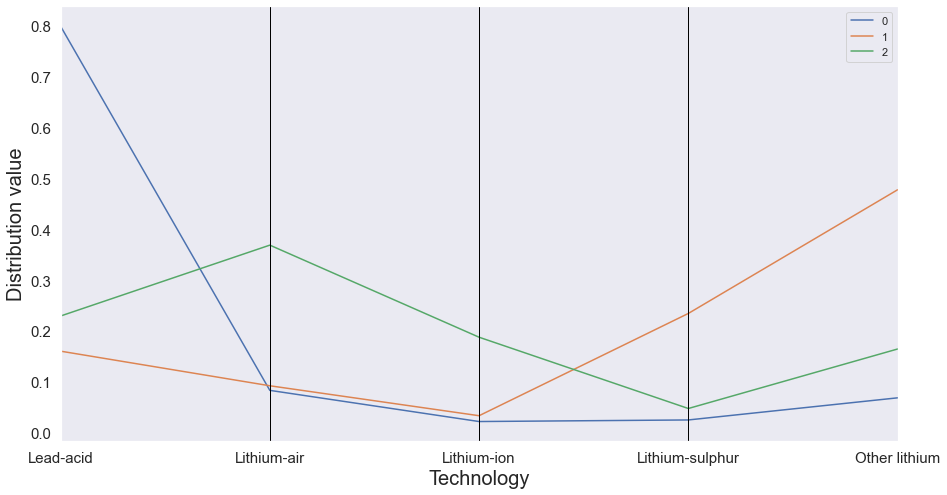

Cluster profiles


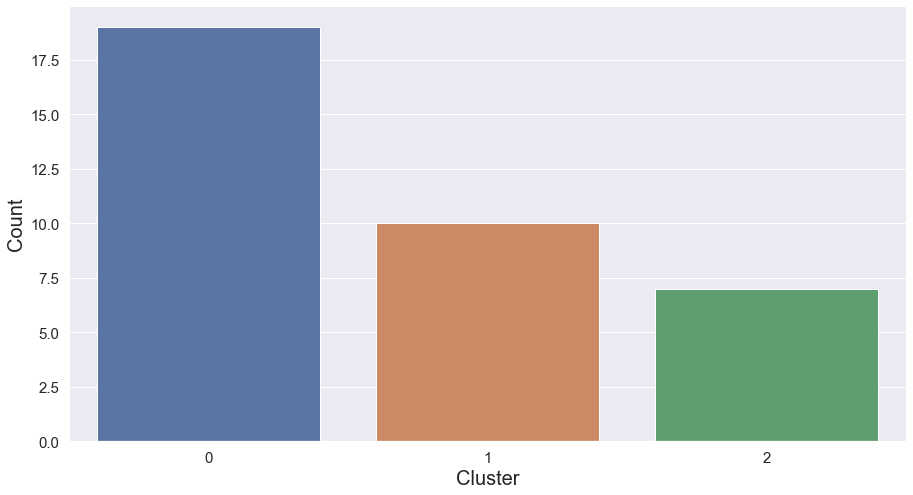

Counts per cluster


In [416]:
result_normalised_2000_2009_k_3, result_absolute_2000_2009_k_3 = run_k_means(data_to_cluster, data_normalised, data_absolute, n_clusters=3)

result_normalised = result_normalised_2000_2009_k_3
result_absolute = result_absolute_2000_2009_k_3

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)

In [417]:
show_result(1)

10
['Japan', 'USA', 'South Korea', 'Germany', 'Taiwan', 'Belgium', 'Austria', 'Netherlands', 'Thailand', 'Switzerland']


,Lead-acid,Lithium-air,Lithium-ion,Lithium-sulphur,Other lithium,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,1
US,136.911719,61.510281,22.516071,61.228175,208.145884,1
KR,19.000000,110.203530,28.179762,67.334774,149.934774,1
DE,28.391958,50.482900,2.291667,18.250000,58.630592,1
TW,4.500000,1.555556,0.750000,3.229167,9.000000,1
BE,1.000000,0.000000,0.000000,15.476190,0.000000,1
AT,2.000000,0.916667,0.000000,1.000000,9.948413,1
NL,6.000000,0.000000,0.000000,1.571429,5.493590,1
TH,0.000000,0.000000,0.000000,0.000000,6.500000,1
CH,0.000000,0.000000,0.416667,1.000000,4.166667,1


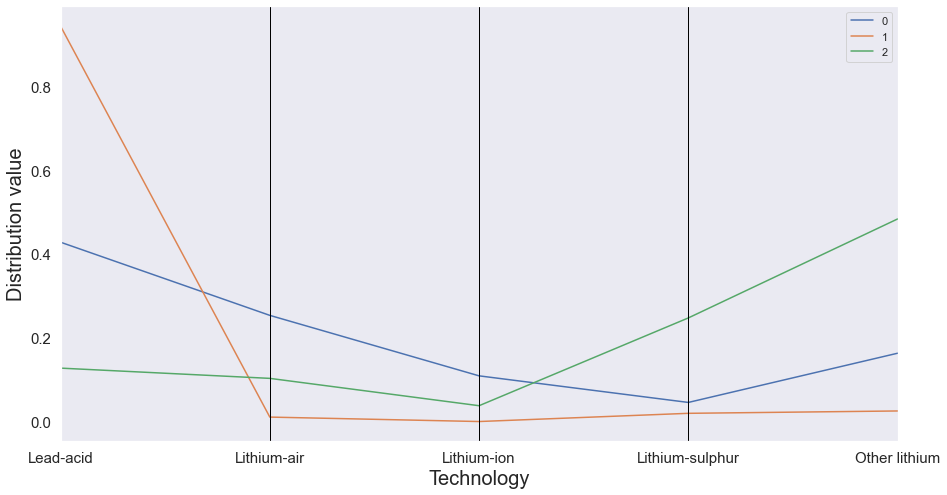

Cluster profiles


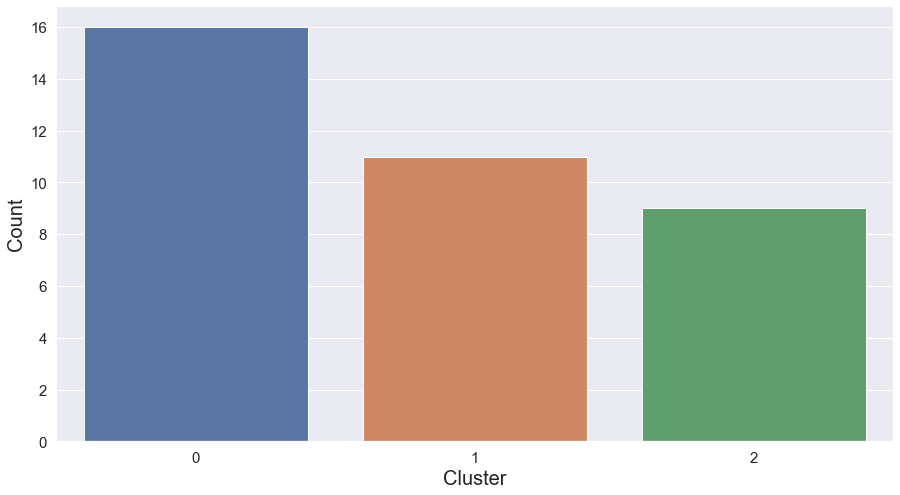

Counts per cluster


In [418]:
result_normalised_2000_2009_h_3, result_absolute_2000_2009_h_3 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=3)

result_normalised = result_normalised_2000_2009_h_3
result_absolute = result_absolute_2000_2009_h_3

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)

### Find 5 clusters

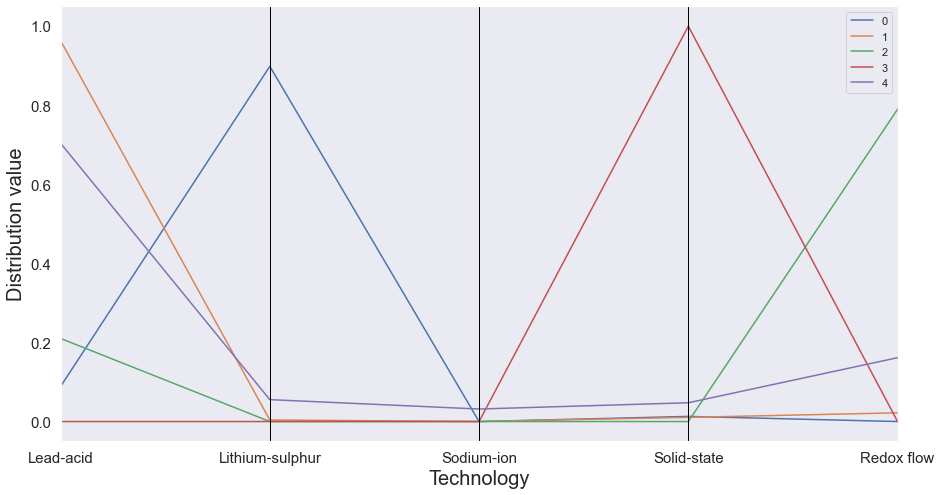

Cluster profiles


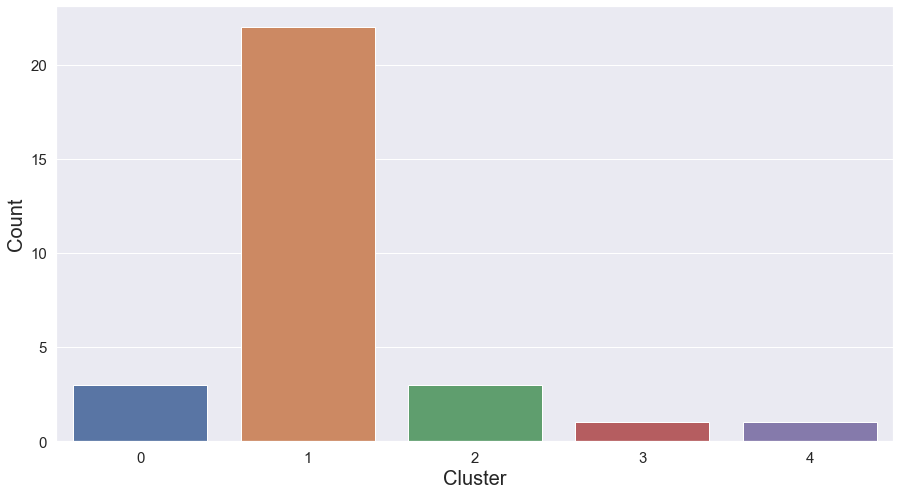

Counts per cluster


In [207]:
result_normalised_2000_2009_k_5, result_absolute_2000_2009_k_5 = run_k_means(data_to_cluster, data_normalised, data_absolute, n_clusters=5)

result_normalised = result_normalised_2000_2009_k_5
result_absolute = result_absolute_2000_2009_k_5

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


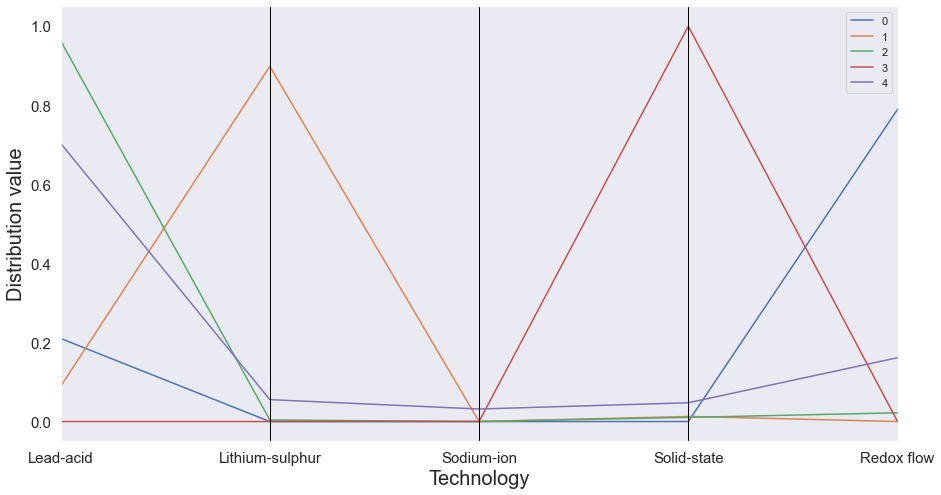

Cluster profiles


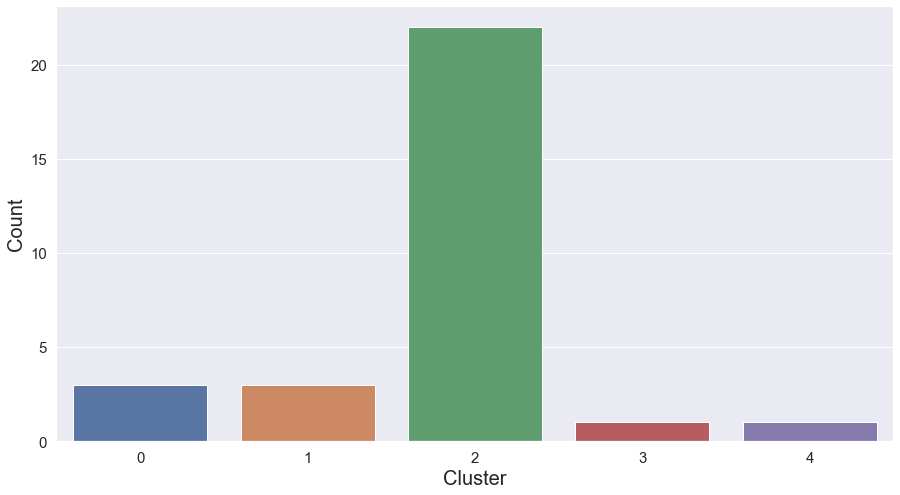

Counts per cluster


In [208]:
result_normalised_2000_2009_h_5, result_absolute_2000_2009_h_5 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=5)

result_normalised = result_normalised_2000_2009_h_5
result_absolute = result_absolute_2000_2009_h_5

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


### 2009-2018 / 2010-2019


In [209]:
data_absolute, data_normalised, data_to_cluster = get_dataframes(1,
                                                                tech_dist_dfs_absolute_list_2000_2010_2019,
                                                                tech_dist_dfs_normalised_list_2000_2010_2019,
                                                                tech_dist_dfs_normalised_scaled_list_2000_2010_2019)


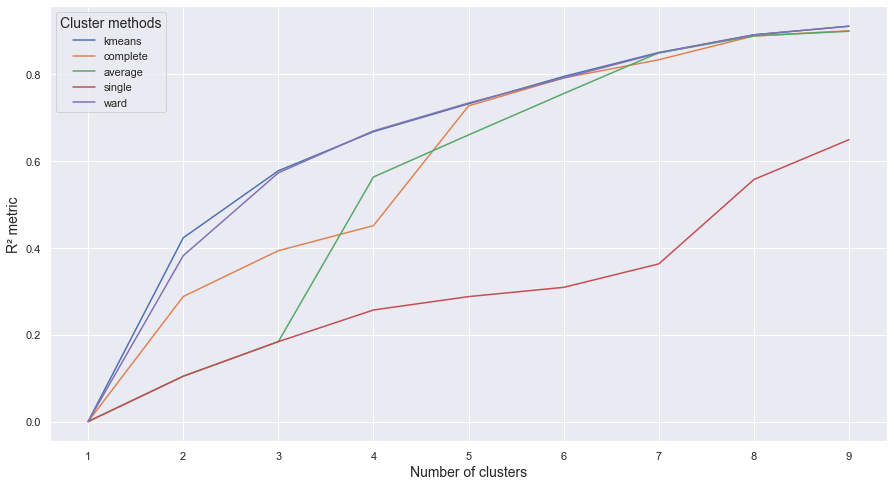

'R² plot for various clustering methods'

In [210]:
check_clustering_methods(data_to_cluster)


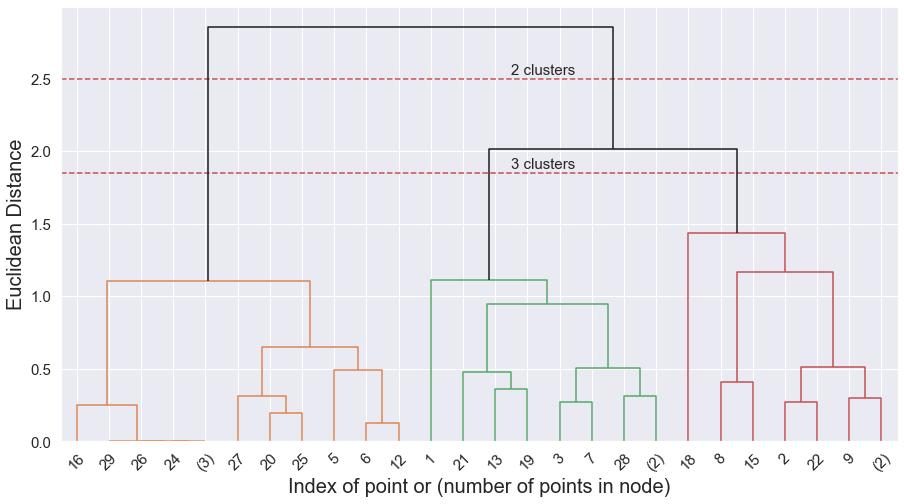

"Dendrogram - Hierarchical Clustering using Ward's linkage"

In [211]:
agglom_clustering_full(data_to_cluster, 2.5, 1.85)


### Find 2 clusters

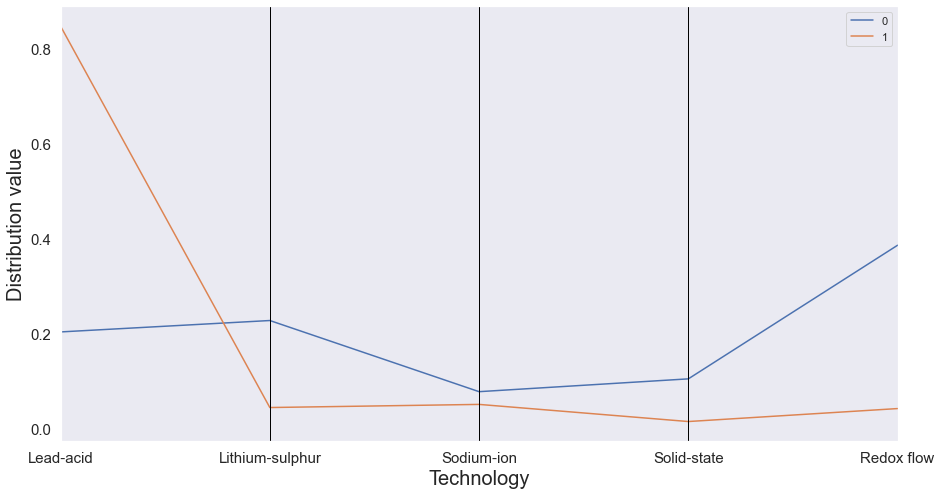

Cluster profiles


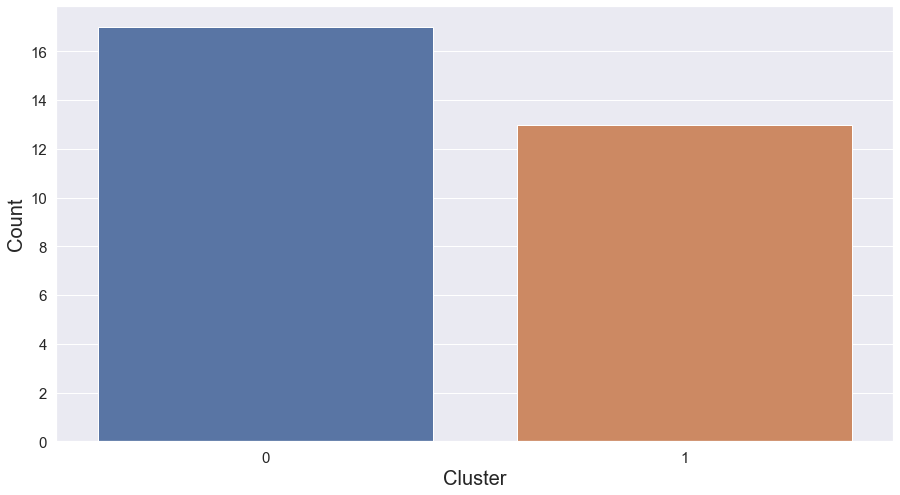

Counts per cluster


In [212]:
result_normalised_2010_2019_k_2, result_absolute_2010_2019_k_2 = run_k_means(data_to_cluster, data_normalised, data_absolute, n_clusters=2)

result_normalised = result_normalised_2010_2019_k_2
result_absolute = result_absolute_2010_2019_k_2

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


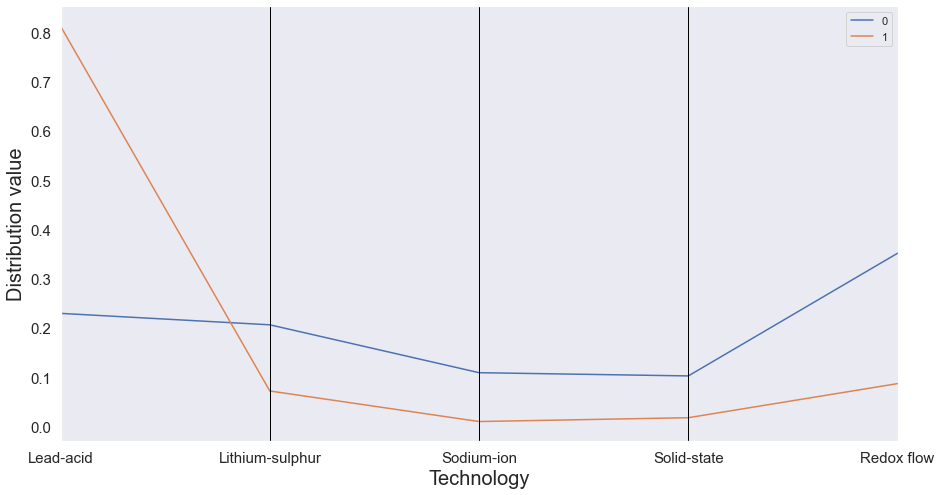

Cluster profiles


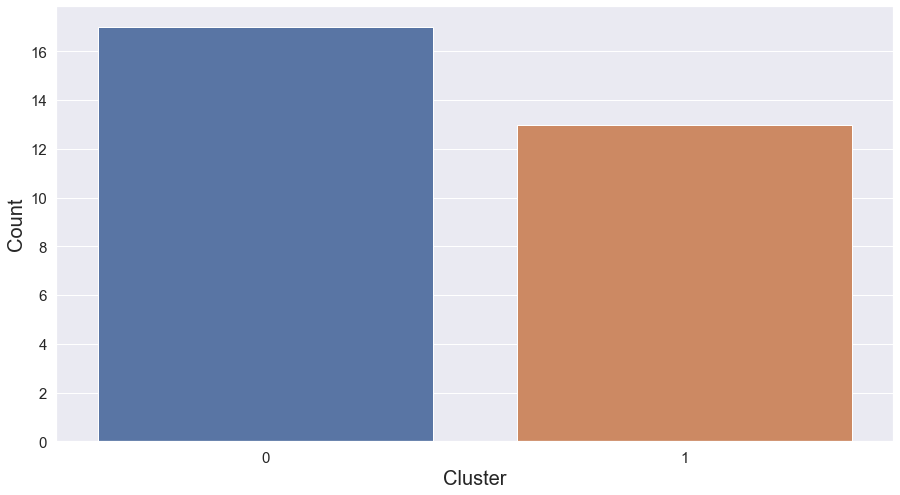

Counts per cluster


In [213]:
result_normalised_2010_2019_k_2, result_absolute_2010_2019_k_2 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=2)

result_normalised = result_normalised_2010_2019_k_2
result_absolute = result_absolute_2010_2019_k_2

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


In [214]:
show_result(0)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,0
US,136.911719,61.510281,22.516071,61.228175,208.145884,0
KR,19.000000,110.203530,28.179762,67.334774,149.934774,0
CN,59.266667,79.015868,29.627381,16.881548,59.923486,0
DE,28.391958,50.482900,2.291667,18.250000,58.630592,0
GB,4.771251,20.436869,10.958333,4.732143,16.289683,0
FR,7.696154,18.472222,8.767532,7.486111,6.615079,0
CA,6.692857,5.283333,4.928571,0.777778,5.983987,0
TW,4.500000,1.555556,0.750000,3.229167,9.000000,0
AT,2.000000,0.916667,0.000000,1.000000,9.948413,0


In [215]:
show_result(1)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
IT,10.250000,2.771429,0.000000,0.750000,6.854545,1
IN,10.522233,0.944444,0.830357,1.531746,0.815657,1
RU,5.000000,0.281385,0.000000,0.625000,0.976190,1
TR,5.000000,0.125000,0.500000,0.000000,1.125000,1
AU,3.179545,1.500000,0.000000,0.000000,2.000000,1
BG,5.571429,0.000000,0.000000,0.000000,0.000000,1
NZ,5.000000,0.000000,0.000000,0.000000,0.000000,1
LU,3.666667,0.000000,0.000000,0.000000,0.000000,1
SE,3.000000,0.000000,0.000000,0.000000,0.000000,1
MT,1.300000,0.000000,0.000000,0.000000,0.000000,1


### Find 3 clusters

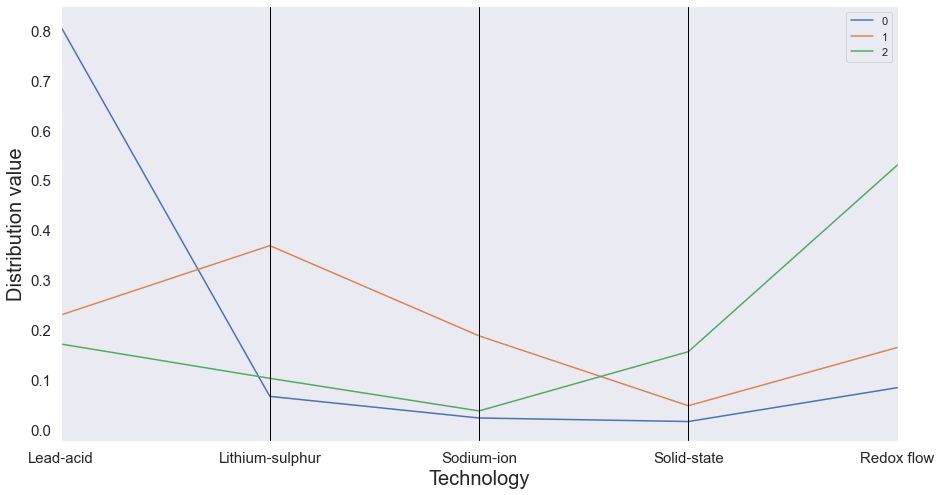

Cluster profiles


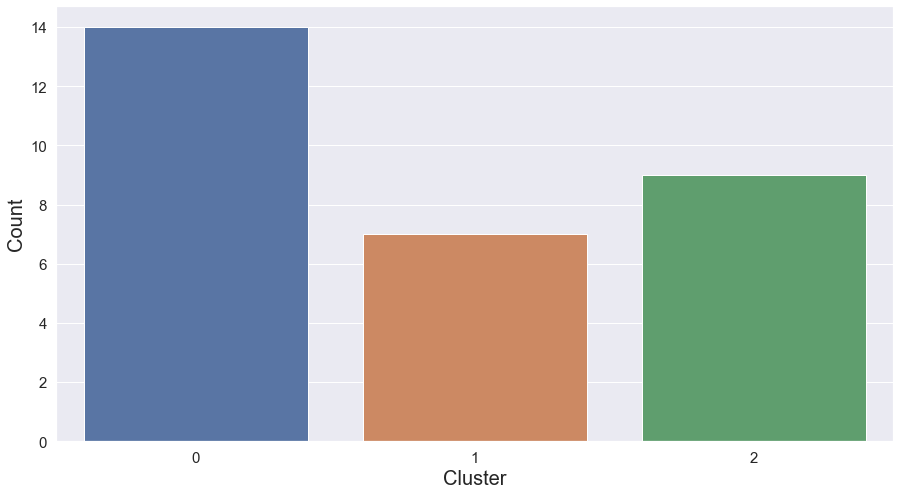

Counts per cluster


In [322]:
result_normalised_2010_2019_k_3, result_absolute_2010_2019_k_3 = run_k_means(
    data_to_cluster, data_normalised, data_absolute, n_clusters=3)

result_normalised = result_normalised_2010_2019_k_3
result_absolute = result_absolute_2010_2019_k_3

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)


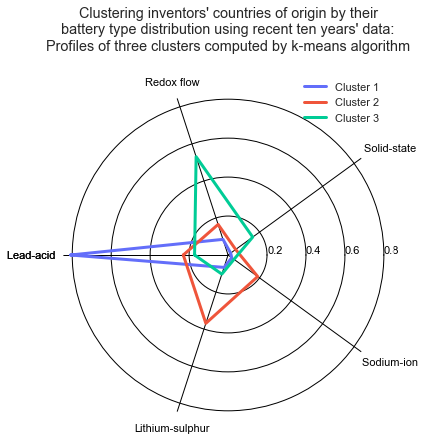

In [323]:
cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [324]:
len(result_normalised)


30

In [325]:
if False:
    
    result_normalised_2010_2019_h_3, result_absolute_2010_2019_h_3 = run_agglomerative(data_to_cluster, data_normalised, data_absolute, n_clusters=3)

    result_normalised = result_normalised_2010_2019_h_3
    result_absolute = result_absolute_2010_2019_h_3

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)


In [326]:
# find
show_result(0)


14
['Italy', 'India', 'Russia', 'Turkey', 'Australia', 'Bulgaria', 'New Zealand', 'Luxembourg', 'Sweden', 'Malta', 'Mexico', 'Norway', 'Hungary', 'Greece']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
IT,10.250000,2.771429,0.000000,0.750000,6.854545,0
IN,10.522233,0.944444,0.830357,1.531746,0.815657,0
RU,5.000000,0.281385,0.000000,0.625000,0.976190,0
TR,5.000000,0.125000,0.500000,0.000000,1.125000,0
AU,3.179545,1.500000,0.000000,0.000000,2.000000,0
BG,5.571429,0.000000,0.000000,0.000000,0.000000,0
NZ,5.000000,0.000000,0.000000,0.000000,0.000000,0
LU,3.666667,0.000000,0.000000,0.000000,0.000000,0
SE,3.000000,0.000000,0.000000,0.000000,0.000000,0
MT,1.300000,0.000000,0.000000,0.000000,0.000000,0


In [327]:
show_result(1)


7
['China', 'UK', 'France', 'Canada', 'Spain', 'Hong Kong SAR (China)', 'Ukraine']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
CN,59.266667,79.015868,29.627381,16.881548,59.923486,1
GB,4.771251,20.436869,10.958333,4.732143,16.289683,1
FR,7.696154,18.472222,8.767532,7.486111,6.615079,1
CA,6.692857,5.283333,4.928571,0.777778,5.983987,1
ES,1.750000,3.000000,2.818182,0.000000,2.357143,1
HK,0.000000,0.500000,0.000000,0.000000,0.000000,1
UA,0.250000,0.000000,0.125000,0.000000,0.000000,1


In [328]:
show_result(2)


9
['Japan', 'USA', 'South Korea', 'Germany', 'Taiwan', 'Austria', 'Netherlands', 'Thailand', 'Switzerland']


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,2
US,136.911719,61.510281,22.516071,61.228175,208.145884,2
KR,19.000000,110.203530,28.179762,67.334774,149.934774,2
DE,28.391958,50.482900,2.291667,18.250000,58.630592,2
TW,4.500000,1.555556,0.750000,3.229167,9.000000,2
AT,2.000000,0.916667,0.000000,1.000000,9.948413,2
NL,6.000000,0.000000,0.000000,1.571429,5.493590,2
TH,0.000000,0.000000,0.000000,0.000000,6.500000,2
CH,0.000000,0.000000,0.416667,1.000000,4.166667,2


### Find 4 clusters

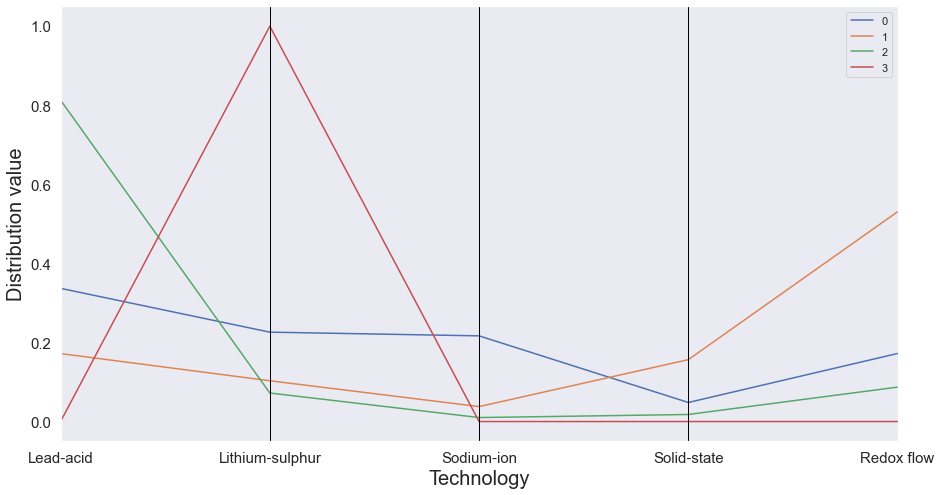

Cluster profiles


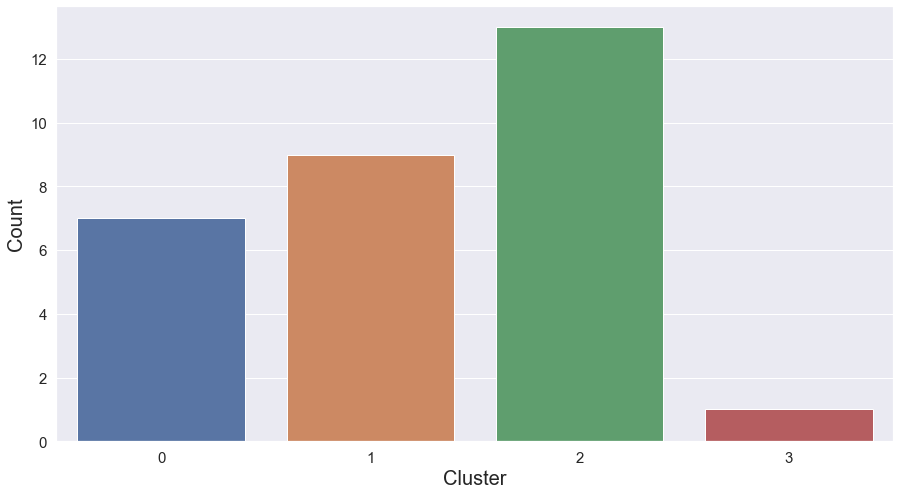

Counts per cluster


In [222]:
result_normalised_2010_2019_k_4, result_absolute_2010_2019_k_4 = run_k_means(
    data_to_cluster, data_normalised, data_absolute, n_clusters=4)

result_normalised = result_normalised_2010_2019_k_4
result_absolute = result_absolute_2010_2019_k_4

show_cluster_profiles(result_normalised)

plot_cluster_counts(result_normalised)

In [223]:
if False:
    
    result_normalised_2010_2019_h_4, result_absolute_2010_2019_h_4 = run_agglomerative(
        data_to_cluster, data_normalised, data_absolute, n_clusters=4)

    result_normalised = result_normalised_2010_2019_h_4
    result_absolute = result_absolute_2010_2019_h_4

    show_cluster_profiles(result_normalised)

    plot_cluster_counts(result_normalised)

In [224]:
show_result(0)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
CN,59.266667,79.015868,29.627381,16.881548,59.923486,0
GB,4.771251,20.436869,10.958333,4.732143,16.289683,0
FR,7.696154,18.472222,8.767532,7.486111,6.615079,0
CA,6.692857,5.283333,4.928571,0.777778,5.983987,0
ES,1.750000,3.000000,2.818182,0.000000,2.357143,0
NO,0.625000,0.000000,0.166667,0.000000,0.041667,0
UA,0.250000,0.000000,0.125000,0.000000,0.000000,0


In [225]:
show_result(1)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
JP,191.699026,40.047701,87.932143,434.247368,216.770263,1
US,136.911719,61.510281,22.516071,61.228175,208.145884,1
KR,19.000000,110.203530,28.179762,67.334774,149.934774,1
DE,28.391958,50.482900,2.291667,18.250000,58.630592,1
TW,4.500000,1.555556,0.750000,3.229167,9.000000,1
AT,2.000000,0.916667,0.000000,1.000000,9.948413,1
NL,6.000000,0.000000,0.000000,1.571429,5.493590,1
TH,0.000000,0.000000,0.000000,0.000000,6.500000,1
CH,0.000000,0.000000,0.416667,1.000000,4.166667,1


In [226]:
show_result(2)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
IT,10.250000,2.771429,0.000000,0.750000,6.854545,2
IN,10.522233,0.944444,0.830357,1.531746,0.815657,2
RU,5.000000,0.281385,0.000000,0.625000,0.976190,2
TR,5.000000,0.125000,0.500000,0.000000,1.125000,2
AU,3.179545,1.500000,0.000000,0.000000,2.000000,2
BG,5.571429,0.000000,0.000000,0.000000,0.000000,2
NZ,5.000000,0.000000,0.000000,0.000000,0.000000,2
LU,3.666667,0.000000,0.000000,0.000000,0.000000,2
SE,3.000000,0.000000,0.000000,0.000000,0.000000,2
MT,1.300000,0.000000,0.000000,0.000000,0.000000,2


In [227]:
show_result(3)


,Lead-acid,Lithium-sulphur,Sodium-ion,Solid-state,Redox flow,label
HK,0.0,0.5,0.0,0.0,0.0,3


# Collect all final plots in one place

In [228]:
person_ctry_code_plot.show()


In [229]:
person_ctry_pop_plot_2.show()


In [230]:
bubbles_plot.show()


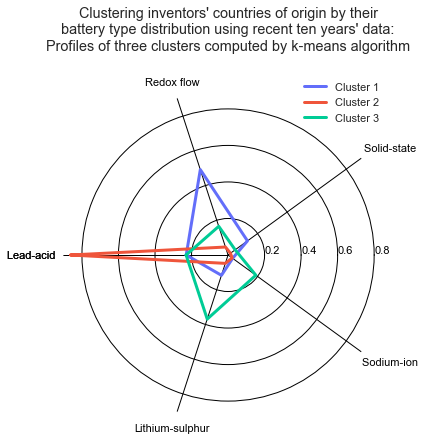

In [246]:
cluster_profiles_radar(
    result_normalised,
    "Clustering inventors' countries of origin by their\nbattery type distribution using recent ten years' data:\nProfiles of three clusters computed by k-means algorithm",
    (0.7, 0.87), # legend_pos
    40, # title_pad
    [0.2, 0.4, 0.6, 0.8], # y_ticks
    True,
    'major',
    'both',
    'black',
    '-',
    1
)


In [232]:
technologies_countries_all_plot.show()
